In this test we use the FoF parameters from MAGIC (ie 500km/s & 450kpc). The center is either the barycenter (weighted by Mstar) or the heaviest galaxy when there is one. Mvir and Rvir are computed from **5Rsigma^2/G (as Knoblel+09) but with R as the std** in projected space.

In [2]:
import numpy as np
import scipy as sc
import matplotlib.pyplot as plt
import pandas as pd
from astropy.table import Table
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy import constants as const
from astropy import units as u
from astropy.coordinates import SkyCoord, Distance
from astropy.cosmology import Planck15
from astropy.cosmology import WMAP9 as cosmo
from scipy.stats import binned_statistic
import matplotlib.backends.backend_pdf

import groups_tools as gid #the important homemade module

%load_ext autoreload
%autoreload 2

# Initial setups

In [3]:
plt.rcParams['text.usetex']=True
plt.rcParams['font.size']=16
plt.rcParams['lines.linewidth']=1.5
plt.rcParams['axes.linewidth']=2.0
plt.rcParams['image.interpolation']='none'
plt.rcParams['xtick.labelsize']='medium'
plt.rcParams['ytick.labelsize']='medium'
plt.rcParams['xtick.minor.visible']=True
plt.rcParams['ytick.minor.visible']=True
plt.rcParams['xtick.minor.size']=4.0
plt.rcParams['xtick.major.size']=8.0
plt.rcParams['ytick.minor.size']=4.0
plt.rcParams['ytick.major.size']=8.0
plt.rcParams['legend.numpoints']=1
plt.rcParams['image.origin']='lower'
plt.rcParams['font.family']='serif'
plt.rcParams['font.serif']='Computer Modern'

In [4]:
# wavelengths:
mgii_a = 2796.352
mgii_b = 2803.530
oii_a = 3727.10
oii_b = 3729.86

muse_min = 4800
muse_max = 9300

uves_min = 3000
uves_max = 11000

In [5]:
z_oii_a_muse_min = muse_min/oii_a -1
z_oii_a_muse_max = muse_max/oii_a -1

z_oii_b_muse_min = muse_min/oii_b -1
z_oii_b_muse_max = muse_max/oii_b -1

z_mgii_a_uves_min = uves_min/mgii_a -1
z_mgii_a_uves_max = uves_max/mgii_a -1

z_mgii_b_uves_min = uves_min/mgii_b -1
z_mgii_b_uves_max = uves_max/mgii_b -1

print("min z for oii in muse = ", z_oii_a_muse_min)
print("max z for oii in muse = ", z_oii_a_muse_max)

print("min z for mgii in uves = ", z_mgii_a_uves_min)
print("max z for mgii in uves = ", z_mgii_a_uves_max)

min z for oii in muse =  0.2878645595771512
max z for oii in muse =  1.4952375841807304
min z for mgii in uves =  0.07282631085070834
max z for mgii in uves =  2.933696473119264


# Data imports

In [6]:
megaflow_data = 'MEGAFLOW_master_dr2.v20230429.fits'
temp = Table.read(megaflow_data, format='fits')
data = temp.to_pandas()
stellar_masses_v01 = pd.read_csv("mass_selectcat_v01b_reconmaster.tb.txt", sep = '|', skipinitialspace=True)
stellar_masses_v02 = pd.read_csv("mass_cat_master_v02psf.tb.txt", sep = "|", skipinitialspace = True)
Abs = pd.read_csv("MgII_all_absorption")
fields_info = pd.read_csv("fields_info_ebv.csv")
cov_table = pd.read_csv("group_abs_coverage_table.csv")

print("N of entries in megaflow: ", len(data))
print("N of entries in stellar_masses v01: ", len(stellar_masses_v01))
print("N of entries in stellar_masses v02: ", len(stellar_masses_v02))
print("N of entries in MgII_all_absorption: ", len(Abs))
print("N of entries in fields_info: ", len(fields_info))
print("N of entries in coverage table: ", len(cov_table))

N of entries in megaflow:  2463
N of entries in stellar_masses v01:  915
N of entries in stellar_masses v02:  21
N of entries in MgII_all_absorption:  126
N of entries in fields_info:  22
N of entries in coverage table:  1216


In [7]:
data.columns

Index(['ID', 'FIELD', 'DATASET', 'FROM', 'Z', 'ZCONF', 'is_QSO', 'is_star',
       'DR1_id', 'DR1_nbmatch', 'RA', 'DEC', 'B_KPC', 'B_ARCSEC', 'REFSPEC',
       'REFCENTER', 'FELINE_ID', 'WHITE_ID', 'MANUAL_ID', 'fel_ID',
       'FEL_score', 'FEL_sigma', 'white_ID', 'wh_SDSS_r', 'wh_SDSS_i',
       'sp_F775W', 'sp_SDSS_r', 'sp_SDSS_i', 'SDSS_r', 'SDSS_i',
       'OII3726_FLUX', 'OII3726_FLUX_ERR', 'OII3726_EQW', 'OII3726_FLUX_EQW',
       'OII3729_FLUX', 'OII3729_FLUX_ERR', 'OII3729_EQW', 'OII3729_EQW_ERR',
       'MGII2796_EMI_FLUX', 'MGII2796_EMI_FLUX_ERR', 'MGII2796_ABS_EQW',
       'MGII2796_ABS_EQW_ERR', 'MGII2803_EMI_FLUX', 'MGII2803_EMI_FLUX_ERR',
       'MGII2803_ABS_EQW', 'MGII2803_ABS_EQW_ERR', 'sed_logMass',
       'sed_logMass_l95', 'sed_logMass_u95', 'sed_rchisq', 'sed_ebv',
       'sed_ebv_l95', 'sed_ebv_u95', 'sed_age', 'sed_age_l95', 'sed_age_u95',
       'sed_metallicity', 'sed_tau', 'sed_tau_l95', 'sed_tau_u95',
       'sed_curr_sfr', 'sed_curr_sfr_l95', 'sed_curr_sfr_

In [8]:
data = data.astype({'FIELD': 'string'})
data = data.rename(columns={"FIELD": "field_id"})
#data = data.rename(columns={"white_ID": "WHITE_ID"})
f1 = data["Z"].isnull() == False
f2 = data["Z"] != 0
f3 = data["ZCONF"] != 0
df = data[f1 & f2 & f3]

In [9]:
fields_list = df["field_id"].unique()
for f in fields_list:
    idx = df.index[df["field_id"] == f].tolist()
    df.loc[idx, "field_id"] = f[2:12]

/home/mcherrey/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [10]:
len(df)

2020

In [11]:
df.columns

Index(['ID', 'field_id', 'DATASET', 'FROM', 'Z', 'ZCONF', 'is_QSO', 'is_star',
       'DR1_id', 'DR1_nbmatch', 'RA', 'DEC', 'B_KPC', 'B_ARCSEC', 'REFSPEC',
       'REFCENTER', 'FELINE_ID', 'WHITE_ID', 'MANUAL_ID', 'fel_ID',
       'FEL_score', 'FEL_sigma', 'white_ID', 'wh_SDSS_r', 'wh_SDSS_i',
       'sp_F775W', 'sp_SDSS_r', 'sp_SDSS_i', 'SDSS_r', 'SDSS_i',
       'OII3726_FLUX', 'OII3726_FLUX_ERR', 'OII3726_EQW', 'OII3726_FLUX_EQW',
       'OII3729_FLUX', 'OII3729_FLUX_ERR', 'OII3729_EQW', 'OII3729_EQW_ERR',
       'MGII2796_EMI_FLUX', 'MGII2796_EMI_FLUX_ERR', 'MGII2796_ABS_EQW',
       'MGII2796_ABS_EQW_ERR', 'MGII2803_EMI_FLUX', 'MGII2803_EMI_FLUX_ERR',
       'MGII2803_ABS_EQW', 'MGII2803_ABS_EQW_ERR', 'sed_logMass',
       'sed_logMass_l95', 'sed_logMass_u95', 'sed_rchisq', 'sed_ebv',
       'sed_ebv_l95', 'sed_ebv_u95', 'sed_age', 'sed_age_l95', 'sed_age_u95',
       'sed_metallicity', 'sed_tau', 'sed_tau_l95', 'sed_tau_u95',
       'sed_curr_sfr', 'sed_curr_sfr_l95', 'sed_curr_s

In [12]:
f1 = df["Z"] < z_oii_a_muse_max
f2 = df["Z"] > z_oii_a_muse_min
N_z_oii_muse = len(df[f1 & f2])
N_z_mgii_uves = len(df[df["Z"] < z_mgii_a_uves_max])

print("Number of galaxies located at z compatible with [OII] in Muse: ", N_z_oii_muse)
print("Number of galaxies located at z compatible with MgII in Uves: ", N_z_mgii_uves)

Number of galaxies located at z compatible with [OII] in Muse:  1201
Number of galaxies located at z compatible with MgII in Uves:  1397


# Match the masses

In [13]:
len(df[~df["sed_logMass"].isna()])

1356

In [14]:
len(df[df["sed_logMass"].isna()])

664

For galaxies with no mass, we assign the median mass of the sample in a new column:

In [14]:
df["mass_noNA"] = df["sed_logMass"]
idx_nomass = ((df[df["sed_logMass"].isna()]).index).tolist()
df.loc[idx_nomass, "mass_noNA"] = df["sed_logMass"].median()
len(df[df["mass_noNA"].isna()])

<ipython-input-14-5b05900f86de>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mass_noNA"] = df["sed_logMass"]
/home/mcherrey/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


0

In [15]:
f1 = df["sed_logMass"].isna()
f2 = df["SDSS_r"].isna()
print("number of galaxies without mass: ", len(df[f1]))
print("number of galaxies without SDSS r: ", len(df[f2]))
print("number of galaxies without nor mass neither SDSS r: ", len(df[f1&f2]))
print("number of galaxies without mass but with SDSS r: ", len(df[f1&~f2]))
print("number of galaxies with mass but without SDSS r: ", len(df[~f1&f2]))

number of galaxies without mass:  664
number of galaxies without SDSS r:  222
number of galaxies without nor mass neither SDSS r:  0
number of galaxies without mass but with SDSS r:  664
number of galaxies with mass but without SDSS r:  222


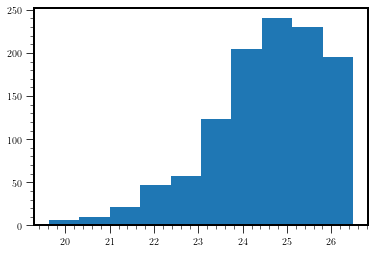

In [16]:
P = df[~f1]
plt.hist(P["SDSS_r"]);

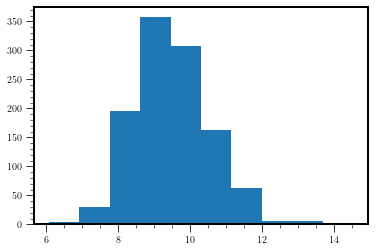

In [17]:
P = df[~f2]
plt.hist(P["sed_logMass"]);

**So all the galaxies without mass do not have SDSS r. But some galaxies (370) with SDSS r have no mass.**

In [18]:
QSOs = df[df["is_QSO"] == 1]

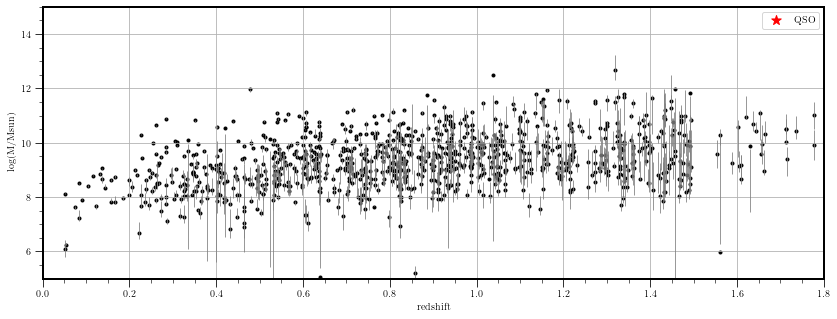

In [19]:
plt.figure(figsize=(14,5))
plt.vlines(df["Z"], df["sed_logMass_l95"], df["sed_logMass_u95"], color ="gray", linewidth = 0.8)
plt.scatter(df["Z"], df["sed_logMass"], marker = ".", c ="black")
plt.scatter(QSOs["Z"], QSOs["sed_logMass"], marker = "*", color = "red", s = 100, label = "QSO")
plt.ylim((5, 15))
plt.xlim((0,1.8))
plt.xlabel("redshift")
plt.ylabel("log(M/Msun)")
plt.grid()
plt.legend()

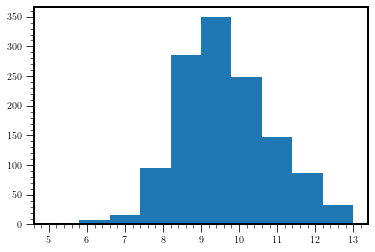

In [20]:
plt.hist(df["sed_logMass"], range = (5,13));


In [21]:
df["mass"] = df["sed_logMass"]

<ipython-input-21-e2deb8f15ab1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mass"] = df["sed_logMass"]


# Adding new fields

### Distances:

In [22]:
df["dist_ang"] = Distance(unit=u.m, z = df["Z"]).value/((1+df["Z"])**2)
df["dist_lum"] = Distance(unit=u.m, z = df["Z"]).value

<ipython-input-22-7b88e9c87834>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["dist_ang"] = Distance(unit=u.m, z = df["Z"]).value/((1+df["Z"])**2)
<ipython-input-22-7b88e9c87834>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["dist_lum"] = Distance(unit=u.m, z = df["Z"]).value


### Neighbours

In [23]:
df = gid.get_Nxxx_neighb(df, radius = 100)
df = gid.get_Nxxx_neighb(df, radius = 50)

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:847: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:846: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

# Some theoretical calculations:

### Overdensities caracterisation

The number of galaxies that we expect to find in a cylinder of 100 kpc radius and +- 1000 km/s depth chosen at a 'random' place in the universe at redshift 1 is: 

In [24]:
z = [1]
M = [0]
d = np.array([z,M])
ref_sample = pd.DataFrame(d.T, columns = ["mean_z", "M_vel_disp"])
ref_sample = gid.get_all_expected_group_density(ref_sample, Radius = 100);
print("Nb of galaxies expected at a random place: ", round(float(ref_sample["N100_exp"].values),2), "+-", round(float(ref_sample["N100_exp_sigma"].values), 2))

R0 =  0
Z =  1       rz =  8319.340288578165
0.05227195666662151 0.05227195666662151 0.0 8319.340288578165
Nb of galaxies expected at a random place:  0.05 +- 0.23


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1011: RuntimeWarning: divide by zero encountered in log10
  logM = np.log10(M)


In [25]:
N_exp = float(ref_sample["N100_exp"].values)
N_exp_sigma = float(ref_sample["N100_exp_sigma"].values)
print("with 68% CL, we expect not more than: ", round(N_exp + N_exp_sigma, 2), "galaxies")
print("with 95% CL, we expect not more than: ", round(N_exp + 2*N_exp_sigma, 2), "galaxies")
print("with 99.7% CL, we expect not more than: ", round(N_exp + 3*N_exp_sigma, 2), "galaxies")

with 68% CL, we expect not more than:  0.28 galaxies
with 95% CL, we expect not more than:  0.51 galaxies
with 99.7% CL, we expect not more than:  0.74 galaxies


Now, if we pick a galaxy (let say of mass $1e11 M_{\odot}$), the probability to find another one in a 100 kpc radius is: 

In [26]:
z = [1]
M = [1e11]
d = np.array([z,M])
ref_sample2 = pd.DataFrame(d.T, columns = ["mean_z", "M_vel_disp"])
ref_sample2 = gid.get_all_expected_group_density(ref_sample2, Radius = 100, dv = 0.5e6);
print("Nb of galaxies expected at a random place: ", round(float(ref_sample2["N100_exp"].values),2), "+-", round(float(ref_sample2["N100_exp_sigma"].values), 2))


R0 =  2079.6
Z =  1.0       rz =  4159.670144289083
0.4319789415302203 0.026135978333310755 0.26746123561661245 4159.670144289083
Nb of galaxies expected at a random place:  0.43 +- 0.84


And for the whole Muse field, we can take a cylinder with the same area as the MUSE FOV:

In [27]:
angr = np.sqrt(3600/np.pi)*u.arcsec
#sep = 0.5*u.arcmin
#sep = 30*u.arcsec
sep = angr.to(u.radian)
rr = sep.value*Distance(unit=u.kpc, z = 1).value/((1+1)**2)
rr = int(np.round(rr))
print("radius: ", rr)

z = [1]
M = [1e11]
d = np.array([z,M])
ref_sample2 = pd.DataFrame(d.T, columns = ["mean_z", "M_vel_disp"])
ref_sample2 = gid.get_all_expected_group_density(ref_sample2, Radius = rr, dv = 0.5e6);
print("Nb of galaxies expected at a random place: ", round(float(ref_sample2["N279_exp"].values),2), "+-", round(float(ref_sample2["N279_exp_sigma"].values), 2))

radius:  279
R0 =  2079.6
Z =  1.0       rz =  4159.670144289083
1.5948579509629193 0.20344506894432426 2.6360777772187007 4159.670144289083
Nb of galaxies expected at a random place:  1.59 +- 2.06


### Nb of groups expected

According to Girelli 2020 Girelli 2020 (or  Hernandez-Aguayo 2018, or https://doi.org/10.1093/mnras/sty2270), we expect around 3e-4 halos of more than 1e13 Msun per Mpc3.h-3  
and approx 1e-3 halos ofr more than 1e12 Msun
![image.png](attachment:image.png)

In [28]:
Vmegaflow = gid.Vmegaflow(z_oii_a_muse_min, z_oii_b_muse_max) # in comoving Mpc3
Vmegaflow

<Quantity 1887.89461126 Mpc3>

In [29]:
z_oii_b_muse_min

0.2869115730885341

So we expect:

In [30]:
print("We expect ~", np.round(Vmegaflow.value*10**(-3.7), 2), "groups with halo mass above 1e13 Msun per field")
print("We expect ~", np.round(Vmegaflow.value*10**(-3), 2), "groups with halo mass above 1e12 Msun per field")
print("We expect ~", np.round(22*Vmegaflow.value*10**(-3.7), 1), "groups with halo mass above 1e13 Msun")
print("We expect ~", np.round(22*Vmegaflow.value*10**(-3), 1), "groups with halo mass above 1e12 Msun")

We expect ~ 0.38 groups with halo mass above 1e13 Msun per field
We expect ~ 1.89 groups with halo mass above 1e12 Msun per field
We expect ~ 8.3 groups with halo mass above 1e13 Msun
We expect ~ 41.5 groups with halo mass above 1e12 Msun


# I. FoF algorithm

In [31]:
R_fof = gid.FoF(df, D0 = 500, V0 = 400) #Using the parameters of Huchra & Geller, tested on TNG100 at z = 1

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["dist_ang"] = Distance(unit=u.kpc, z = df["Z"]).value/((1+df["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["dist_lum"] = Distance(unit=u.kpc, z = df["Z"]).value
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

iter:  1       nb of ungrouped =  2020
Number of companions found:  1
         ID  group_id
2462  32081    -32081
iter:  2       nb of ungrouped =  2019
Number of companions found:  2
         ID  group_id
2461  32080    -32080
2457  32076    -32076
Number of companions found:  3
         ID  group_id
2461  32080         2
2457  32076         2
2432  32051    -32051
Number of companions found:  2
         ID  group_id
2457  32076         2
2432  32051         2
iter:  3       nb of ungrouped =  2016
Number of companions found:  2
         ID  group_id
2460  32079    -32079
2434  32053    -32053
Number of companions found:  2
         ID  group_id
2460  32079         3
2434  32053         3
iter:  4       nb of ungrouped =  2014
Number of companions found:  1
         ID  group_id
2459  32078    -32078
iter:  5       nb of ungrouped =  2013
Number of companions found:  1
         ID  group_id
2458  32077    -32077
iter:  6       nb of ungrouped =  2012
Number of companions found:  2
   

Number of companions found:  6
         ID  group_id
2380  31132        51
2379  31131        51
2370  31122        51
2351  31103        51
2337  31089        51
2334  31086        51
Number of companions found:  6
         ID  group_id
2380  31132        51
2379  31131        51
2370  31122        51
2351  31103        51
2337  31089        51
2334  31086        51
Number of companions found:  6
         ID  group_id
2380  31132        51
2379  31131        51
2370  31122        51
2351  31103        51
2337  31089        51
2334  31086        51
Number of companions found:  6
         ID  group_id
2380  31132        51
2379  31131        51
2370  31122        51
2351  31103        51
2337  31089        51
2334  31086        51
Number of companions found:  6
         ID  group_id
2380  31132        51
2379  31131        51
2370  31122        51
2351  31103        51
2337  31089        51
2334  31086        51
iter:  52       nb of ungrouped =  1948
Number of companions found:  4
    

Number of companions found:  1
         ID  group_id
2288  31040    -31040
iter:  91       nb of ungrouped =  1887
Number of companions found:  1
         ID  group_id
2286  31038    -31038
iter:  92       nb of ungrouped =  1886
Number of companions found:  1
         ID  group_id
2284  31036    -31036
iter:  93       nb of ungrouped =  1885
Number of companions found:  1
         ID  group_id
2280  31032    -31032
iter:  94       nb of ungrouped =  1884
Number of companions found:  1
         ID  group_id
2276  31028    -31028
iter:  95       nb of ungrouped =  1883
Number of companions found:  1
         ID  group_id
2272  31024    -31024
iter:  96       nb of ungrouped =  1882
Number of companions found:  1
         ID  group_id
2271  31023    -31023
iter:  97       nb of ungrouped =  1881
Number of companions found:  1
         ID  group_id
2270  31022    -31022
iter:  98       nb of ungrouped =  1880
Number of companions found:  1
         ID  group_id
2269  31021    -31021
iter:

Number of companions found:  3
         ID  group_id
2222  30085       137
2201  30064       137
2197  30060       137
iter:  138       nb of ungrouped =  1823
Number of companions found:  2
         ID  group_id
2220  30083    -30083
2212  30075    -30075
Number of companions found:  3
         ID  group_id
2220  30083       138
2212  30075       138
2152  30015    -30015
Number of companions found:  2
         ID  group_id
2212  30075       138
2152  30015       138
iter:  139       nb of ungrouped =  1820
Number of companions found:  3
         ID  group_id
2218  30081    -30081
2155  30018    -30018
2142  30005    -30005
Number of companions found:  3
         ID  group_id
2218  30081       139
2155  30018       139
2142  30005       139
Number of companions found:  3
         ID  group_id
2218  30081       139
2155  30018       139
2142  30005       139
iter:  140       nb of ungrouped =  1817
Number of companions found:  2
         ID  group_id
2217  30080    -30080
2211  30074  

Number of companions found:  1
         ID  group_id
2131  29095    -29095
iter:  191       nb of ungrouped =  1754
Number of companions found:  1
         ID  group_id
2130  29094    -29094
iter:  192       nb of ungrouped =  1753
Number of companions found:  4
         ID  group_id
2129  29093    -29093
2117  29081    -29081
2114  29078    -29078
2107  29071    -29071
Number of companions found:  4
         ID  group_id
2129  29093       192
2117  29081       192
2114  29078       192
2107  29071       192
Number of companions found:  4
         ID  group_id
2129  29093       192
2117  29081       192
2114  29078       192
2107  29071       192
Number of companions found:  4
         ID  group_id
2129  29093       192
2117  29081       192
2114  29078       192
2107  29071       192
iter:  193       nb of ungrouped =  1749
Number of companions found:  2
         ID  group_id
2128  29092    -29092
2038  29002    -29002
Number of companions found:  2
         ID  group_id
2128  29092  

Number of companions found:  1
         ID  group_id
2050  29014    -29014
iter:  239       nb of ungrouped =  1687
Number of companions found:  1
         ID  group_id
2049  29013    -29013
iter:  240       nb of ungrouped =  1686
Number of companions found:  1
         ID  group_id
2048  29012    -29012
iter:  241       nb of ungrouped =  1685
Number of companions found:  1
         ID  group_id
2047  29011    -29011
iter:  242       nb of ungrouped =  1684
Number of companions found:  1
         ID  group_id
2046  29010    -29010
iter:  243       nb of ungrouped =  1683
Number of companions found:  1
         ID  group_id
2045  29009    -29009
iter:  244       nb of ungrouped =  1682
Number of companions found:  1
         ID  group_id
2044  29008    -29008
iter:  245       nb of ungrouped =  1681
Number of companions found:  1
         ID  group_id
2043  29007    -29007
iter:  246       nb of ungrouped =  1680
Number of companions found:  1
         ID  group_id
2042  29006    -290

Number of companions found:  1
         ID  group_id
2001  28074    -28074
iter:  273       nb of ungrouped =  1627
Number of companions found:  2
         ID  group_id
1998  28071    -28071
1954  28026    -28026
Number of companions found:  2
         ID  group_id
1998  28071       273
1954  28026       273
iter:  274       nb of ungrouped =  1625
Number of companions found:  1
         ID  group_id
1997  28070    -28070
iter:  275       nb of ungrouped =  1624
Number of companions found:  1
         ID  group_id
1995  28068    -28068
iter:  276       nb of ungrouped =  1623
Number of companions found:  1
         ID  group_id
1990  28063    -28063
iter:  277       nb of ungrouped =  1622
Number of companions found:  1
         ID  group_id
1988  28061    -28061
iter:  278       nb of ungrouped =  1621
Number of companions found:  1
         ID  group_id
1987  28060    -28060
iter:  279       nb of ungrouped =  1620
Number of companions found:  1
         ID  group_id
1986  28059    -

Number of companions found:  1
         ID  group_id
1922  27096    -27096
iter:  325       nb of ungrouped =  1561
Number of companions found:  1
         ID  group_id
1921  27095    -27095
iter:  326       nb of ungrouped =  1560
Number of companions found:  4
         ID  group_id
1920  27094    -27094
1919  27093    -27093
1887  27061    -27061
1861  27035    -27035
Number of companions found:  4
         ID  group_id
1920  27094       326
1919  27093       326
1887  27061       326
1861  27035       326
Number of companions found:  4
         ID  group_id
1920  27094       326
1919  27093       326
1887  27061       326
1861  27035       326
Number of companions found:  4
         ID  group_id
1920  27094       326
1919  27093       326
1887  27061       326
1861  27035       326
iter:  327       nb of ungrouped =  1556
Number of companions found:  2
         ID  group_id
1917  27091    -27091
1892  27066    -27066
Number of companions found:  2
         ID  group_id
1917  27091  

Number of companions found:  1
         ID  group_id
1833  27007    -27007
iter:  380       nb of ungrouped =  1491
Number of companions found:  1
         ID  group_id
1832  27006    -27006
iter:  381       nb of ungrouped =  1490
Number of companions found:  1
         ID  group_id
1831  27005    -27005
iter:  382       nb of ungrouped =  1489
Number of companions found:  1
         ID  group_id
1830  27004    -27004
iter:  383       nb of ungrouped =  1488
Number of companions found:  1
         ID  group_id
1829  27003    -27003
iter:  384       nb of ungrouped =  1487
Number of companions found:  1
         ID  group_id
1828  27002    -27002
iter:  385       nb of ungrouped =  1486
Number of companions found:  1
         ID  group_id
1827  27001    -27001
iter:  386       nb of ungrouped =  1485
Number of companions found:  4
         ID  group_id
1826  26096    -26096
1796  26066    -26066
1785  26055    -26055
1778  26048    -26048
Number of companions found:  5
         ID  gro

Number of companions found:  1
         ID  group_id
1779  26049    -26049
iter:  416       nb of ungrouped =  1427
Number of companions found:  1
         ID  group_id
1777  26047    -26047
iter:  417       nb of ungrouped =  1426
Number of companions found:  1
         ID  group_id
1774  26044    -26044
iter:  418       nb of ungrouped =  1425
Number of companions found:  1
         ID  group_id
1771  26041    -26041
iter:  419       nb of ungrouped =  1424
Number of companions found:  1
         ID  group_id
1768  26038    -26038
iter:  420       nb of ungrouped =  1423
Number of companions found:  1
         ID  group_id
1766  26036    -26036
iter:  421       nb of ungrouped =  1422
Number of companions found:  1
         ID  group_id
1765  26035    -26035
iter:  422       nb of ungrouped =  1421
Number of companions found:  1
         ID  group_id
1764  26034    -26034
iter:  423       nb of ungrouped =  1420
Number of companions found:  1
         ID  group_id
1759  26029    -260

Number of companions found:  1
         ID  group_id
1700  25065    -25065
iter:  466       nb of ungrouped =  1362
Number of companions found:  1
         ID  group_id
1699  25064    -25064
iter:  467       nb of ungrouped =  1361
Number of companions found:  1
         ID  group_id
1696  25061    -25061
iter:  468       nb of ungrouped =  1360
Number of companions found:  1
         ID  group_id
1695  25060    -25060
iter:  469       nb of ungrouped =  1359
Number of companions found:  1
         ID  group_id
1694  25059    -25059
iter:  470       nb of ungrouped =  1358
Number of companions found:  2
         ID  group_id
1693  25058    -25058
1637  25002    -25002
Number of companions found:  2
         ID  group_id
1693  25058       470
1637  25002       470
iter:  471       nb of ungrouped =  1356
Number of companions found:  1
         ID  group_id
1691  25056    -25056
iter:  472       nb of ungrouped =  1355
Number of companions found:  1
         ID  group_id
1690  25055    -

Number of companions found:  2
         ID  group_id
1621  24046    -24046
1617  24042    -24042
Number of companions found:  2
         ID  group_id
1621  24046       524
1617  24042       524
iter:  525       nb of ungrouped =  1291
Number of companions found:  1
         ID  group_id
1619  24044    -24044
iter:  526       nb of ungrouped =  1290
Number of companions found:  1
         ID  group_id
1615  24040    -24040
iter:  527       nb of ungrouped =  1289
Number of companions found:  1
         ID  group_id
1614  24039    -24039
iter:  528       nb of ungrouped =  1288
Number of companions found:  2
         ID  group_id
1613  24038    -24038
1612  24037    -24037
Number of companions found:  2
         ID  group_id
1613  24038       528
1612  24037       528
iter:  529       nb of ungrouped =  1286
Number of companions found:  1
         ID  group_id
1609  24034    -24034
iter:  530       nb of ungrouped =  1285
Number of companions found:  1
         ID  group_id
1604  24029  

Number of companions found:  12
         ID  group_id
1571  23157       555
1567  23153       555
1539  23125       555
1538  23124       555
1520  23106       555
1514  23100       555
1511  23097       555
1505  23091       555
1502  23088       555
1469  23055       555
1434  23020       555
1433  23019       555
iter:  556       nb of ungrouped =  1239
Number of companions found:  1
         ID  group_id
1569  23155    -23155
iter:  557       nb of ungrouped =  1238
Number of companions found:  4
         ID  group_id
1568  23154    -23154
1557  23143    -23143
1499  23085    -23085
1448  23034    -23034
Number of companions found:  4
         ID  group_id
1568  23154       557
1557  23143       557
1499  23085       557
1448  23034       557
Number of companions found:  4
         ID  group_id
1568  23154       557
1557  23143       557
1499  23085       557
1448  23034       557
Number of companions found:  4
         ID  group_id
1568  23154       557
1557  23143       557
1499 

Number of companions found:  1
         ID  group_id
1519  23105    -23105
iter:  581       nb of ungrouped =  1187
Number of companions found:  3
         ID  group_id
1517  23103    -23103
1513  23099    -23099
1512  23098    -23098
Number of companions found:  3
         ID  group_id
1517  23103       581
1513  23099       581
1512  23098       581
Number of companions found:  3
         ID  group_id
1517  23103       581
1513  23099       581
1512  23098       581
iter:  582       nb of ungrouped =  1184
Number of companions found:  1
         ID  group_id
1510  23096    -23096
iter:  583       nb of ungrouped =  1183
Number of companions found:  1
         ID  group_id
1506  23092    -23092
iter:  584       nb of ungrouped =  1182
Number of companions found:  1
         ID  group_id
1504  23090    -23090
iter:  585       nb of ungrouped =  1181
Number of companions found:  1
         ID  group_id
1503  23089    -23089
iter:  586       nb of ungrouped =  1180
Number of companions f

Number of companions found:  19
         ID  group_id
1414  22100       617
1404  22090       617
1403  22089       617
1398  22084       617
1396  22082       617
1389  22075       617
1388  22074       617
1386  22072       617
1385  22071       617
1381  22067       617
1379  22065       617
1378  22064       617
1376  22062       617
1373  22059       617
1372  22058       617
1369  22055       617
1368  22054       617
1366  22052       617
1364  22050       617
Number of companions found:  20
         ID  group_id
1414  22100       617
1404  22090       617
1403  22089       617
1398  22084       617
1396  22082       617
1389  22075       617
1388  22074       617
1387  22073       617
1386  22072       617
1385  22071       617
1381  22067       617
1379  22065       617
1378  22064       617
1376  22062       617
1373  22059       617
1372  22058       617
1369  22055       617
1368  22054       617
1366  22052       617
1364  22050       617
Number of companions found:  16
  

Number of companions found:  1
         ID  group_id
1380  22066    -22066
iter:  638       nb of ungrouped =  1096
Number of companions found:  2
         ID  group_id
1377  22063    -22063
1370  22056    -22056
Number of companions found:  2
         ID  group_id
1377  22063       638
1370  22056       638
iter:  639       nb of ungrouped =  1094
Number of companions found:  1
         ID  group_id
1375  22061    -22061
iter:  640       nb of ungrouped =  1093
Number of companions found:  1
         ID  group_id
1371  22057    -22057
iter:  641       nb of ungrouped =  1092
Number of companions found:  2
         ID  group_id
1367  22053    -22053
1361  22047    -22047
Number of companions found:  2
         ID  group_id
1367  22053       641
1361  22047       641
iter:  642       nb of ungrouped =  1090
Number of companions found:  1
         ID  group_id
1365  22051    -22051
iter:  643       nb of ungrouped =  1089
Number of companions found:  2
         ID  group_id
1363  22049  

Number of companions found:  2
         ID  group_id
1301  21122    -21122
1234  21055    -21055
Number of companions found:  2
         ID  group_id
1301  21122       689
1234  21055       689
iter:  690       nb of ungrouped =  1026
Number of companions found:  3
         ID  group_id
1300  21121    -21121
1296  21117    -21117
1285  21106    -21106
Number of companions found:  3
         ID  group_id
1300  21121       690
1296  21117       690
1285  21106       690
Number of companions found:  3
         ID  group_id
1300  21121       690
1296  21117       690
1285  21106       690
iter:  691       nb of ungrouped =  1023
Number of companions found:  3
         ID  group_id
1299  21120    -21120
1275  21096    -21096
1248  21069    -21069
Number of companions found:  3
         ID  group_id
1299  21120       691
1275  21096       691
1248  21069       691
Number of companions found:  3
         ID  group_id
1299  21120       691
1275  21096       691
1248  21069       691
iter:  692

Number of companions found:  1
         ID  group_id
1174  20098    -20098
iter:  749       nb of ungrouped =  956
Number of companions found:  1
         ID  group_id
1173  20097    -20097
iter:  750       nb of ungrouped =  955
Number of companions found:  2
         ID  group_id
1172  20096    -20096
1155  20079    -20079
Number of companions found:  2
         ID  group_id
1172  20096       750
1155  20079       750
iter:  751       nb of ungrouped =  953
Number of companions found:  6
         ID  group_id
1171  20095    -20095
1168  20092    -20092
1151  20075    -20075
1148  20072    -20072
1145  20069    -20069
1139  20063    -20063
Number of companions found:  6
         ID  group_id
1171  20095       751
1168  20092       751
1151  20075       751
1148  20072       751
1145  20069       751
1139  20063       751
Number of companions found:  6
         ID  group_id
1171  20095       751
1168  20092       751
1151  20075       751
1148  20072       751
1145  20069       751
113

Number of companions found:  1
         ID  group_id
1109  20033    -20033
iter:  791       nb of ungrouped =  893
Number of companions found:  2
         ID  group_id
1107  20031    -20031
1088  20012    -20012
Number of companions found:  2
         ID  group_id
1107  20031       791
1088  20012       791
iter:  792       nb of ungrouped =  891
Number of companions found:  1
         ID  group_id
1106  20030    -20030
iter:  793       nb of ungrouped =  890
Number of companions found:  1
         ID  group_id
1105  20029    -20029
iter:  794       nb of ungrouped =  889
Number of companions found:  1
         ID  group_id
1104  20028    -20028
iter:  795       nb of ungrouped =  888
Number of companions found:  1
         ID  group_id
1103  20027    -20027
iter:  796       nb of ungrouped =  887
Number of companions found:  1
         ID  group_id
1100  20024    -20024
iter:  797       nb of ungrouped =  886
Number of companions found:  1
         ID  group_id
1098  20022    -20022
i

Number of companions found:  2
         ID  group_id
1041  19071    -19071
1032  19062    -19062
Number of companions found:  2
         ID  group_id
1041  19071       836
1032  19062       836
iter:  837       nb of ungrouped =  825
Number of companions found:  2
         ID  group_id
1040  19070    -19070
972   19002    -19002
Number of companions found:  2
         ID  group_id
1040  19070       837
972   19002       837
iter:  838       nb of ungrouped =  823
Number of companions found:  3
         ID  group_id
1039  19069    -19069
1038  19068    -19068
1036  19066    -19066
Number of companions found:  2
         ID  group_id
1039  19069       838
1038  19068       838
Number of companions found:  2
         ID  group_id
1039  19069       838
1036  19066       838
iter:  839       nb of ungrouped =  820
Number of companions found:  2
         ID  group_id
1034  19064    -19064
1023  19053    -19053
Number of companions found:  2
         ID  group_id
1034  19064       839
1023  1

Number of companions found:  14
        ID  group_id
969  18096       861
968  18095       861
951  18078       861
946  18073       861
945  18072       861
942  18069       861
939  18066       861
937  18064       861
935  18062       861
933  18060       861
921  18048       861
915  18042       861
888  18015       861
874  18001       861
Number of companions found:  14
        ID  group_id
969  18096       861
968  18095       861
957  18084       861
956  18083       861
946  18073       861
945  18072       861
942  18069       861
939  18066       861
937  18064       861
933  18060       861
921  18048       861
915  18042       861
888  18015       861
874  18001       861
Number of companions found:  13
        ID  group_id
969  18096       861
968  18095       861
951  18078       861
946  18073       861
945  18072       861
941  18068       861
939  18066       861
935  18062       861
921  18048       861
915  18042       861
889  18016       861
888  18015       861
8

Number of companions found:  1
        ID  group_id
894  18021    -18021
iter:  897       nb of ungrouped =  721
Number of companions found:  1
        ID  group_id
893  18020    -18020
iter:  898       nb of ungrouped =  720
Number of companions found:  1
        ID  group_id
892  18019    -18019
iter:  899       nb of ungrouped =  719
Number of companions found:  2
        ID  group_id
885  18012    -18012
877  18004    -18004
Number of companions found:  2
        ID  group_id
885  18012       899
877  18004       899
iter:  900       nb of ungrouped =  717
Number of companions found:  1
        ID  group_id
883  18010    -18010
iter:  901       nb of ungrouped =  716
Number of companions found:  1
        ID  group_id
881  18008    -18008
iter:  902       nb of ungrouped =  715
Number of companions found:  1
        ID  group_id
880  18007    -18007
iter:  903       nb of ungrouped =  714
Number of companions found:  1
        ID  group_id
878  18005    -18005
iter:  904       nb o

Number of companions found:  1
        ID  group_id
815  17046    -17046
iter:  942       nb of ungrouped =  651
Number of companions found:  1
        ID  group_id
814  17045    -17045
iter:  943       nb of ungrouped =  650
Number of companions found:  1
        ID  group_id
813  17044    -17044
iter:  944       nb of ungrouped =  649
Number of companions found:  1
        ID  group_id
812  17043    -17043
iter:  945       nb of ungrouped =  648
Number of companions found:  1
        ID  group_id
807  17038    -17038
iter:  946       nb of ungrouped =  647
Number of companions found:  1
        ID  group_id
806  17037    -17037
iter:  947       nb of ungrouped =  646
Number of companions found:  1
        ID  group_id
804  17035    -17035
iter:  948       nb of ungrouped =  645
Number of companions found:  1
        ID  group_id
803  17034    -17034
iter:  949       nb of ungrouped =  644
Number of companions found:  1
        ID  group_id
801  17032    -17032
iter:  950       nb of 

Number of companions found:  1
        ID  group_id
747  16090    -16090
iter:  986       nb of ungrouped =  585
Number of companions found:  2
        ID  group_id
746  16089    -16089
669  16012    -16012
Number of companions found:  3
        ID  group_id
746  16089       986
669  16012       986
668  16011    -16011
Number of companions found:  2
        ID  group_id
669  16012       986
668  16011       986
iter:  987       nb of ungrouped =  582
Number of companions found:  2
        ID  group_id
744  16087    -16087
742  16085    -16085
Number of companions found:  2
        ID  group_id
744  16087       987
742  16085       987
iter:  988       nb of ungrouped =  580
Number of companions found:  2
        ID  group_id
740  16083    -16083
729  16072    -16072
Number of companions found:  2
        ID  group_id
740  16083       988
729  16072       988
iter:  989       nb of ungrouped =  578
Number of companions found:  1
        ID  group_id
739  16082    -16082
iter:  990     

Number of companions found:  2
        ID  group_id
643  15050    -15050
638  15045    -15045
Number of companions found:  2
        ID  group_id
643  15050      1044
638  15045      1044
iter:  1045       nb of ungrouped =  510
Number of companions found:  3
        ID  group_id
642  15049    -15049
639  15046    -15046
631  15038    -15038
Number of companions found:  3
        ID  group_id
642  15049      1045
639  15046      1045
631  15038      1045
Number of companions found:  3
        ID  group_id
642  15049      1045
639  15046      1045
631  15038      1045
iter:  1046       nb of ungrouped =  507
Number of companions found:  1
        ID  group_id
641  15048    -15048
iter:  1047       nb of ungrouped =  506
Number of companions found:  1
        ID  group_id
637  15044    -15044
iter:  1048       nb of ungrouped =  505
Number of companions found:  1
        ID  group_id
636  15043    -15043
iter:  1049       nb of ungrouped =  504
Number of companions found:  1
        ID  

Number of companions found:  2
        ID  group_id
580  14135    -14135
574  14129    -14129
Number of companions found:  2
        ID  group_id
580  14135      1090
574  14129      1090
iter:  1091       nb of ungrouped =  444
Number of companions found:  1
        ID  group_id
579  14134    -14134
iter:  1092       nb of ungrouped =  443
Number of companions found:  3
        ID  group_id
575  14130    -14130
473  14028    -14028
469  14024    -14024
Number of companions found:  3
        ID  group_id
575  14130      1092
473  14028      1092
469  14024      1092
Number of companions found:  3
        ID  group_id
575  14130      1092
473  14028      1092
469  14024      1092
iter:  1093       nb of ungrouped =  440
Number of companions found:  1
        ID  group_id
573  14128    -14128
iter:  1094       nb of ungrouped =  439
Number of companions found:  2
        ID  group_id
572  14127    -14127
562  14117    -14117
Number of companions found:  2
        ID  group_id
572  14127 

Number of companions found:  2
        ID  group_id
462  14017      1150
450  14005      1150
iter:  1151       nb of ungrouped =  371
Number of companions found:  1
        ID  group_id
461  14016    -14016
iter:  1152       nb of ungrouped =  370
Number of companions found:  1
        ID  group_id
459  14014    -14014
iter:  1153       nb of ungrouped =  369
Number of companions found:  1
        ID  group_id
458  14013    -14013
iter:  1154       nb of ungrouped =  368
Number of companions found:  1
        ID  group_id
457  14012    -14012
iter:  1155       nb of ungrouped =  367
Number of companions found:  1
        ID  group_id
456  14011    -14011
iter:  1156       nb of ungrouped =  366
Number of companions found:  1
        ID  group_id
455  14010    -14010
iter:  1157       nb of ungrouped =  365
Number of companions found:  1
        ID  group_id
454  14009    -14009
iter:  1158       nb of ungrouped =  364
Number of companions found:  1
        ID  group_id
453  14008    -

Number of companions found:  3
        ID  group_id
419  13105      1184
402  13088      1184
378  13064      1184
Number of companions found:  3
        ID  group_id
419  13105      1184
402  13088      1184
378  13064      1184
iter:  1185       nb of ungrouped =  307
Number of companions found:  1
        ID  group_id
417  13103    -13103
iter:  1186       nb of ungrouped =  306
Number of companions found:  1
        ID  group_id
416  13102    -13102
iter:  1187       nb of ungrouped =  305
Number of companions found:  4
        ID  group_id
411  13097    -13097
399  13085    -13085
392  13078    -13078
389  13075    -13075
Number of companions found:  5
        ID  group_id
411  13097      1187
399  13085      1187
398  13084    -13084
392  13078      1187
389  13075      1187
Number of companions found:  4
        ID  group_id
399  13085      1187
398  13084      1187
392  13078      1187
389  13075      1187
Number of companions found:  5
        ID  group_id
411  13097      1187

Number of companions found:  2
        ID  group_id
304  12119      1240
302  12117      1240
iter:  1241       nb of ungrouped =  237
Number of companions found:  2
        ID  group_id
301  12116    -12116
298  12113    -12113
Number of companions found:  2
        ID  group_id
301  12116      1241
298  12113      1241
iter:  1242       nb of ungrouped =  235
Number of companions found:  3
        ID  group_id
300  12115    -12115
292  12107    -12107
288  12103    -12103
Number of companions found:  3
        ID  group_id
300  12115      1242
292  12107      1242
288  12103      1242
Number of companions found:  3
        ID  group_id
300  12115      1242
292  12107      1242
288  12103      1242
iter:  1243       nb of ungrouped =  232
Number of companions found:  1
        ID  group_id
299  12114    -12114
iter:  1244       nb of ungrouped =  231
Number of companions found:  2
        ID  group_id
297  12112    -12112
293  12108    -12108
Number of companions found:  2
        ID 

Number of companions found:  1
        ID  group_id
197  12012    -12012
iter:  1295       nb of ungrouped =  167
Number of companions found:  1
        ID  group_id
196  12011    -12011
iter:  1296       nb of ungrouped =  166
Number of companions found:  1
        ID  group_id
193  12008    -12008
iter:  1297       nb of ungrouped =  165
Number of companions found:  1
        ID  group_id
190  12005    -12005
iter:  1298       nb of ungrouped =  164
Number of companions found:  1
        ID  group_id
189  12004    -12004
iter:  1299       nb of ungrouped =  163
Number of companions found:  1
        ID  group_id
186  12001    -12001
iter:  1300       nb of ungrouped =  162
Number of companions found:  6
        ID  group_id
185  11186    -11186
114  11115    -11115
107  11108    -11108
95   11096    -11096
90   11091    -11091
22   11023    -11023
Number of companions found:  6
        ID  group_id
185  11186      1300
114  11115      1300
113  11114    -11114
107  11108      1300
95

Number of companions found:  2
        ID  group_id
158  11159      1318
52   11053      1318
iter:  1319       nb of ungrouped =  108
Number of companions found:  1
        ID  group_id
157  11158    -11158
iter:  1320       nb of ungrouped =  107
Number of companions found:  1
        ID  group_id
155  11156    -11156
iter:  1321       nb of ungrouped =  106
Number of companions found:  3
        ID  group_id
153  11154    -11154
148  11149    -11149
93   11094    -11094
Number of companions found:  3
        ID  group_id
153  11154      1321
148  11149      1321
93   11094      1321
Number of companions found:  3
        ID  group_id
153  11154      1321
148  11149      1321
93   11094      1321
iter:  1322       nb of ungrouped =  103
Number of companions found:  2
        ID  group_id
152  11153    -11153
11   11012    -11012
Number of companions found:  2
        ID  group_id
152  11153      1322
11   11012      1322
iter:  1323       nb of ungrouped =  101
Number of companions f

Number of companions found:  3
       ID  group_id
53  11054    -11054
32  11033      1367
24  11025      1367
Number of companions found:  2
       ID  group_id
53  11054      1367
24  11025      1367
iter:  1368       nb of ungrouped =  34
Number of companions found:  1
       ID  group_id
54  11055    -11055
iter:  1369       nb of ungrouped =  33
Number of companions found:  1
       ID  group_id
50  11051    -11051
iter:  1370       nb of ungrouped =  32
Number of companions found:  1
       ID  group_id
41  11042    -11042
iter:  1371       nb of ungrouped =  31
Number of companions found:  2
       ID  group_id
40  11041    -11041
29  11030    -11030
Number of companions found:  2
       ID  group_id
40  11041      1371
29  11030      1371
iter:  1372       nb of ungrouped =  29
Number of companions found:  1
       ID  group_id
39  11040    -11040
iter:  1373       nb of ungrouped =  28
Number of companions found:  4
       ID  group_id
38  11039    -11039
14  11015    -11015
4

In [32]:
R_fof.to_csv("R_real_fof_500_400_raw_new.csv", index = False)
R_fof.to_csv("R_real_fof_630_400_raw_new.csv", index = False)
#R_fof = pd.read_csv("R_real_fof_450_500_raw.csv", index_col = False)

In [33]:
G_fof = gid.get_groups(R_fof, N_min = 1)
G3_fof = gid.get_groups(R_fof, N_min = 3)
G5_fof = gid.get_groups(R_fof, N_min = 5)

#### then we can compute the mass from velocity

For that we assume that the system is virialiazed and we apply the virial theorem that state that $2 E_c = E_p$. If we assume that all the galaxies of the group have the same mass $m$ things can be simplified. The kinetic energy is equal to :
\begin{equation}
E_k = \sum_i \frac{1}{2} m (v_i - v_{center})^2
\end{equation}

But by definition: 
\begin{equation}
\sigma_v^2 = \frac{1}{N} \sum_i (v_i - v_{center})^2
\end{equation}

So: 
\begin{equation}
E_k = \frac{m}{2} N \sigma_v^2 =  \frac{M}{2}  \sigma_v^2 \\
\end{equation}

On the other hand, the potential energy is given by:
\begin{equation}
E_p = \sum_{i, j} \frac{-G m_i m_j}{r_{i,j}}
\end{equation}
 
 \begin{equation}
E_p \approx -G m^2 \sum_{i, j} \frac{1}{R} = \frac{-G m^2}{R} \sum_{i=1}^N i\\
E_p = \frac{-G m^2 N(N-1)}{2R}\\
E_p \approx \frac{-G M^2}{2R}
\end{equation}

So Finally:
\begin{equation}
M \sigma_v^2 = \frac{-G M^2}{2R}\\
M = \frac{2R\sigma_v^2}{G}
\end{equation}

In [34]:
R_fof, G_fof = gid.calc_mass(R_fof, G_fof, N_lim = 3)

/home/mcherrey/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0, 0.5, 'M from $\\sigma^3$ (Bryan+97)')

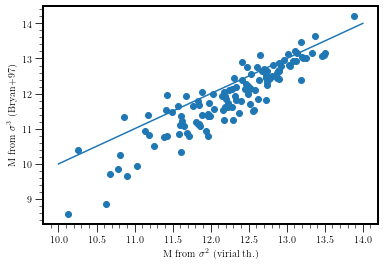

In [35]:
plt.scatter(np.log10(G_fof["Mvir_sigma2"]), np.log10(G_fof["Mvir_sigma3"]))
plt.plot([10,14], [10,14])
plt.xlabel("M from $\sigma^2$ (virial th.)")
plt.ylabel("M from $\sigma^3$ (Bryan+97)")

In [36]:
print("N of group of more than 3 galaxies: ", len(G3_fof))
print("N of group of more than 5 galaxies: ", len(G5_fof))

N of group of more than 3 galaxies:  124
N of group of more than 5 galaxies:  35


In [37]:
131-38

93

### Recompute the centers

For the centers we can just take the barycenters weighted by the stellar mass. With that method we don't have the drawback to choose arbitrarily a mass ratio threshold, so we don't have a sudden change of position under this value. In addition, we can estimate the error on the position of the center coming from the mass estimation.

To compute the error on the barycenter we need the error on the stellar mass. We have the 95% (2 sigma) lower and upper values in the catalogs, we could take the max of the diff between the bound and the central value, or the mean. Here we take the diff between the upper value and the central value:

In [38]:
#R_fof["mass10_err"] = np.max(10**R_fof["mass"] - 10**R_fof["mass_l68"], 10**R_fof["mass_u68"] - 10**R_fof["mass"])
logM_2sigma_err =  -R_fof["mass"] + R_fof["sed_logMass_u95"]
logM_1sigma_err = logM_2sigma_err/2
M_1sigma_err =  10**(R_fof["mass"] + logM_1sigma_err) - 10**R_fof["mass"]
R_fof["mass10_err"] = M_1sigma_err
#R_fof["mass10_err"] = (10**R_fof["mass"] - 10**R_fof["sed_logMass_l95"]) + (10**R_fof["sed_logMass_u95"] - 10**R_fof["mass"])

In [39]:
G_fof = gid.calc_mass_ratio(G_fof, R_fof)
G_fof = gid.recompute_centers_new(G_fof, R_fof)

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:228: RuntimeWarning: invalid value encountered in double_scalars
  center_ra = (r["mass10"] * r["RA"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:229: RuntimeWarning: invalid value encountered in double_scalars
  center_dec = (r["mass10"] * r["DEC"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:230: RuntimeWarning: invalid value encountered in double_scalars
  center_z = (r["mass10"] * r["Z"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:228: RuntimeWarning: invalid value encountered in double_scalars
  center_ra = (r["mass10"] * r["RA"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:229: RuntimeWarning: invalid value encountered in double_scalars
  center_dec = (r["mass10"] * r["DEC"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_group

### Match with QSO

In [40]:
R_fof = gid.match_qso(R_fof, fields_info)
G_fof = gid.match_qso(G_fof, fields_info)
len(G_fof["group_id"])

1392

In [41]:
f1 = G_fof["Mvir_sigma2"]>=1e12
f2 = G_fof["Mvir_sigma2"]>=1e13
f3 = G_fof["mean_z"]>=0.3
f4 = G_fof["mean_z"]<=1.5
print("Number of groups with mass above 1e12 Msun: ", len(G_fof[f1 & f3 & f4]))
print("Number of groups with mass above 1e13 Msun: ", len(G_fof[f2 & f3 & f4]))

Number of groups with mass above 1e12 Msun:  66
Number of groups with mass above 1e13 Msun:  14


### Check for the group completely outside of the trend

In [42]:
G5_fof[G5_fof["field_id"] == "J0131p1303"]

,field_id,group_id,N_gal,mean_z,mean_ra,mean_dec,b_min_kpc,Mvir_sigma2,Mvir_sigma3,Rvir_sigma2,Rvir_sigma3,Mstar
17,J0131p1303,979,6,0.835952,22.9031,13.0606,96.06,NaN,NaN,NaN,NaN,6.118347e+09
21,J0131p1303,969,5,1.33988,22.8958,13.0604,125.53,NaN,NaN,NaN,NaN,1.119316e+12


In [43]:
gg = G5_fof[G5_fof["group_id"] == 979]
rr = R_fof[R_fof["group_id"] == 979]

In [44]:
rrr = rr.sort_values(by = ["mass10"], ascending = False)
rrr[["ID", "mass10"]]

,ID,mass10
1425,16065,2.137947e+09
1422,16069,1.633728e+09
1426,16074,8.673182e+08
1427,16066,5.896865e+08
1423,16097,5.408656e+08
1424,16080,3.488012e+08


In [45]:
2.137947/1.633728

1.3086309348924667

# II. Refinement with Halo occupation method (Hom)

In [43]:
G_hom = G_fof.copy()
R_hom = R_fof.copy()

0
------------- GROUP ID:  617
 M* ====  11.141338586807251
closest match =  11.141337590202054
11.141337590202054 11.141338586807251 11.141389944966697
slope =  2.292077919373132


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.195831931102033
closest match =  11.195841970146413
11.195792426642681 11.195831931102033 11.195841970146413
slope =  2.422137938846364


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.237199553738957
closest match =  11.237191584426256
11.237191584426256 11.237199553738957 11.237239653610525
slope =  2.4964268031431294
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.335896936975484
closest match =  11.335891248799692
11.335891248799692 11.335896936975484 11.335937344524549
slope =  2.603304327778794
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.34431686906824
closest match =  11.34431754044701
11.34427154421881 11.34431686906824 11.34431754044701
slope =  2.6089356607753973
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.351440280735194
closest match =  11.351440753981427
11.35139483636635 11.351440280735194 11.351440753981427
slope =  2.6134022816614544
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.368806653156094
closest match =  11.368810158784072
11.368764412014995 11.368806653156094 11.368810158784072
slope =  2.623162300487247
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.370022237613098
closest match =  11.369999430111077
11.369999430111077 11.370022237613098 11.370045165774878
slope =  2.6237992420062017
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.372393986170463
closest match =  11.372377146639085
11.372377146639085 11.372393986170463 11.372422861288037
slope =  2.6250053924394465
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.42345442105586
closest match =  11.423454931405367
11.423409569045347 11.42345442105586 11.423454931405367
slope =  2.645391464685894
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.431108157185006
closest match =  11.431117779429295
11.431072456467414 11.431108157185006 11.431117779429295
slope =  2.6476910385026255
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.43167236407149
closest match =  11.431661637500023
11.431661637500023 11.43167236407149 11.431706957552969
slope =  2.6478609845080703
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.436107062780213
closest match =  11.436101957498833
11.436101957498833 11.436107062780213 11.436147256159552
slope =  2.6491114330470125
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.438018456992083
closest match =  11.438004318531547
11.438004318531547 11.438018456992083 11.43804960830774
slope =  2.6496311110399073
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.505328203403137
closest match =  11.505342825554159
11.505297763529969 11.505328203403137 11.505342825554159
slope =  2.663022848386569
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.507163584671417
closest match =  11.50714521897781
11.50714521897781 11.507163584671417 11.507190276638518
slope =  2.6632807412811217
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.509233504987456
closest match =  11.509217762969435
11.509217762969435 11.509233504987456 11.509262815829208
slope =  2.6635645464685536
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.514566516723901
closest match =  11.514578340751052
11.514533299762645 11.514566516723901 11.514578340751052
slope =  2.664266577058677
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.514566516723901
closest match =  11.514578340751052
11.514533299762645 11.514566516723901 11.514578340751052
slope =  2.664266577058677
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


1
------------- GROUP ID:  861
 M* ====  10.985515117645264
closest match =  10.98549956523652
10.98549956523652 10.985515117645264 10.985565878049966
slope =  1.809623114666613


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.028185039829967
closest match =  11.028178898672255
11.028178898672255 11.028185039829967 11.028240000060999
slope =  1.9639684544247296


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize = (15,4))


 M* ====  11.028185039829967
closest match =  11.028178898672255
11.028178898672255 11.028185039829967 11.028240000060999
slope =  1.9639684544247296
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.224225516641122
closest match =  11.224242662223585
11.224194828608047 11.224225516641122 11.224242662223585
slope =  2.508721087963543
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.335894041192935
closest match =  11.33588858976092
11.33588858976092 11.335894041192935 11.335934215437616
slope =  2.630124278671553
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.340739259667437
closest match =  11.340722081320102
11.340722081320102 11.340739259667437 11.340767653513327
slope =  2.633210989480974
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.341310933822948
closest match =  11.341314481468704
11.341268915172714 11.341310933822948 11.341314481468704
slope =  2.633551782189871
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.34649531761687
closest match =  11.346505880365154
11.346460368548648 11.34649531761687 11.346505880365154
slope =  2.6367042501265345
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.366374167238124
closest match =  11.36635272228572
11.36635272228572 11.366374167238124 11.366398048742088
slope =  2.647486912231275
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.368713923035113
closest match =  11.368709193768913
11.368709193768913 11.368713923035113 11.368754500528524
slope =  2.6486378862750812
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.375747817564271
closest match =  11.375727374008086
11.375727374008086 11.375747817564271 11.37577262469792
slope =  2.651919792898821
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.382773018521748
closest match =  11.382782353961097
11.382737155589993 11.382773018521748 11.382782353961097
slope =  2.6549894848170856
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.382773018521748
closest match =  11.382782353961097
11.382737155589993 11.382773018521748 11.382782353961097
slope =  2.6549894848170856
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.382773018521748
closest match =  11.382782353961097
11.382737155589993 11.382773018521748 11.382782353961097
slope =  2.6549894848170856
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.382773018521748
closest match =  11.382782353961097
11.382737155589993 11.382773018521748 11.382782353961097
slope =  2.6549894848170856
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.383148036991711
closest match =  11.38314392920934
11.38314392920934 11.383148036991711 11.383189124652475
slope =  2.6551614872255986
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.394963959108363
closest match =  11.3949744545673
11.394929339107053 11.394963959108363 11.3949744545673
slope =  2.659868686982387
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.405931285550938
closest match =  11.405929249133269
11.405929249133269 11.405931285550938 11.405974297811342
slope =  2.6638117952834732
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.405931285550938
closest match =  11.405929249133269
11.405929249133269 11.405931285550938 11.405974297811342
slope =  2.6638117952834732
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


2
------------- GROUP ID:  1300
 M* ====  11.193827390670776
closest match =  11.193803818028886
11.193803818028886 11.193827390670776 11.193851281828819
slope =  2.528267862731112


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.27047471326407
closest match =  11.270457415331473
11.270457415331473 11.27047471326407 11.27050292874797
slope =  2.636611558694967


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.2766681872404
closest match =  11.276685426142482
11.276640018638012 11.2766681872404 11.276685426142482
slope =  2.6427613984498453
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.387155981698932
closest match =  11.387147266393374
11.387147266393374 11.387155981698932 11.387191541765212
slope =  2.7103374863112957
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.38788336450794
closest match =  11.387899913659009
11.387855642289225 11.38788336450794 11.387899913659009
slope =  2.7105824960430422
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.410323907997531
closest match =  11.410315704637217
11.410315704637217 11.410323907997531 11.410359862782897
slope =  2.7175325902057175
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.425951435597746
closest match =  11.425935919530016
11.425935919530016 11.425951435597746 11.425980012722208
slope =  2.721535775619381
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.42883602978296
closest match =  11.42884571062454
11.42880162827707 11.42883602978296 11.42884571062454
slope =  2.722205302086346
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


END: Psat max =  0.34524747480937357
3
------------- GROUP ID:  555
 M* ====  10.705596446990967
closest match =  10.705549756534218
10.705549756534218 10.705596446990967 10.705657275697929
slope =  1.116091270334892


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.80750260204697
closest match =  10.807524055694683
10.807435025002322 10.80750260204697 10.807524055694683
slope =  1.3478632685931247


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.808901533703349
closest match =  10.808857611823523
10.808857611823523 10.808901533703349 10.808946388787609
slope =  1.3517155181780514
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.808901533703349
closest match =  10.808857611823523
10.808857611823523 10.808901533703349 10.808946388787609
slope =  1.3517155181780514
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.833600654469072
closest match =  10.833617598233781
10.833533176738294 10.833600654469072 10.833617598233781
slope =  1.4214531419955354
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.94866425207421
closest match =  10.948632245260292
10.948632245260292 10.94866425207421 10.948698339779035
slope =  1.8155998756751113
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.949131771647995
closest match =  10.949160744490033
10.94909471417917 10.949131771647995 10.949160744490033
slope =  1.8173653651217947
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.949131771647995
closest match =  10.949160744490033
10.94909471417917 10.949131771647995 10.949160744490033
slope =  1.8173653651217947
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


END: Psat max =  0.0005941485465218443
4
------------- GROUP ID:  1089
 M* ====  10.775380849838257
closest match =  10.775377118625542
10.775377118625542 10.775380849838257 10.775468699597358
slope =  1.310328965002066


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.85224499359774
closest match =  10.852277866819108
10.85219990636002 10.85224499359774 10.852277866819108
slope =  1.5392572262191997


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.051227984481345
closest match =  11.051224935216512
11.051224935216512 11.051227984481345 11.051276963774153
slope =  2.3064487168000585
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.05354065348879
closest match =  11.053562044417541
11.053510200915348 11.05354065348879 11.053562044417541
slope =  2.3146815885536873
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.056947292032302
closest match =  11.05692301024221
11.05692301024221 11.056947292032302 11.056974582309921
slope =  2.3268642374970607
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.057514449028423
closest match =  11.057490080144387
11.057490080144387 11.057514449028423 11.057541607679976
slope =  2.3288752050140697
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


END: Psat max =  0.0009481970424533026
5
------------- GROUP ID:  560
 M* ====  11.585887670516968
closest match =  11.58590167601199
11.585857380875671 11.585887670516968 11.58590167601199
slope =  2.7091281342963485


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.68942798538658
closest match =  11.689430869982752
11.689386631081245 11.68942798538658 11.689430869982752
slope =  2.712571875037959


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.68942798538658
closest match =  11.689430869982752
11.689386631081245 11.68942798538658 11.689430869982752
slope =  2.712571875037959
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.691442240186907
closest match =  11.691421606607175
11.691421606607175 11.691442240186907 11.691465844891153
slope =  2.7126097402538685
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.691442240186907
closest match =  11.691421606607175
11.691421606607175 11.691442240186907 11.691465844891153
slope =  2.7126097402538685
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.695144229635257
closest match =  11.695137576721686
11.695137576721686 11.695144229635257 11.69518181391049
slope =  2.712676895983753
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.695144229635257
closest match =  11.695137576721686
11.695137576721686 11.695144229635257 11.69518181391049
slope =  2.712676895983753
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.695144229635257
closest match =  11.695137576721686
11.695137576721686 11.695144229635257 11.69518181391049
slope =  2.712676895983753
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


6
------------- GROUP ID:  322
 M* ====  10.723617315292358
closest match =  10.723576155979679
10.723576155979679 10.723617315292358 10.723676368169508
slope =  1.1974710882499613


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.139077756185783
closest match =  11.139088955812108
11.139042781027115 11.139077756185783 11.139088955812108
slope =  2.5988469687890374


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.141280613577237
closest match =  11.141303125195956
11.141257040729101 11.141280613577237 11.141303125195956
slope =  2.6039402905816575
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.141280613577237
closest match =  11.141303125195956
11.141257040729101 11.141280613577237 11.141303125195956
slope =  2.6039402905816575
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.146698166797238
closest match =  11.146682368770037
11.146682368770037 11.146698166797238 11.146728239026332
slope =  2.616100490879567
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.146698166797238
closest match =  11.146682368770037
11.146682368770037 11.146698166797238 11.146728239026332
slope =  2.616100490879567
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


7
------------- GROUP ID:  13
 M* ====  10.978548884391785
closest match =  10.978570785151287
10.978489848534249 10.978548884391785 10.978570785151287
slope =  1.4826564835815113


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.30358110378497
closest match =  11.303570974008432
11.303570974008432 11.30358110378497 11.303622138050008
slope =  2.3454206570398766


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.30358110378497
closest match =  11.303570974008432
11.303570974008432 11.30358110378497 11.303622138050008
slope =  2.3454206570398766
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.304401060866939
closest match =  11.304389405265683
11.304389405265683 11.304401060866939 11.304440543551083
slope =  2.3466019455096196
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.304401060866939
closest match =  11.304389405265683
11.304389405265683 11.304401060866939 11.304440543551083
slope =  2.3466019455096196
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


8
------------- GROUP ID:  115
 M* ====  10.888729810714722
closest match =  10.888739456721382
10.88865762275437 10.888729810714722 10.888739456721382
slope =  1.4663984210020076


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.007512420749078
closest match =  11.007521986861162
11.007457598796778 11.007512420749078 11.007521986861162
slope =  1.8637180844137944


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.007512420749078
closest match =  11.007521986861162
11.007457598796778 11.007512420749078 11.007521986861162
slope =  1.8637180844137944
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


END: Psat max =  0.25502404831885106
9
------------- GROUP ID:  446
 M* ====  9.81411498785019
closest match =  9.81408753451381
9.81408753451381 9.81411498785019 9.814303383809436
slope =  0.5559489998101663


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.236830275362667
closest match =  10.236746753771941
10.236746753771941 10.236830275362667 10.236933438240762
slope =  0.6428022682951915


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.236830275362667
closest match =  10.236746753771941
10.236746753771941 10.236830275362667 10.236933438240762
slope =  0.6428022682951915
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.236830275362667
closest match =  10.236746753771941
10.236746753771941 10.236830275362667 10.236933438240762
slope =  0.6428022682951915
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.236830275362667
closest match =  10.236746753771941
10.236746753771941 10.236830275362667 10.236933438240762
slope =  0.6428022682951915
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


10
------------- GROUP ID:  908
 M* ====  10.576167345046997
closest match =  10.576131722932507
10.576131722932507 10.576167345046997 10.57625345020276
slope =  0.9858201844497098
BREAK:  4 candidates kept
11
------------- GROUP ID:  1178
 M* ====  10.281065821647644
closest match =  10.280995324340646
10.280995324340646 10.281065821647644 10.281169678610539
slope =  0.6882607468419014


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.359913601076325
closest match =  10.359907767368643
10.359907767368643 10.359913601076325 10.360072707723404
slope =  0.7275429968830218


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.391002435006557
closest match =  10.391031156610099
10.390870209819168 10.391002435006557 10.391031156610099
slope =  0.7455954810845212
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.478734735783078
closest match =  10.478676135941493
10.478676135941493 10.478734735783078 10.478824819304117
slope =  0.8070923194990358
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.478734735783078
closest match =  10.478676135941493
10.478676135941493 10.478734735783078 10.478824819304117
slope =  0.8070923194990358
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


12
------------- GROUP ID:  253
 M* ====  10.95026159286499
closest match =  10.950239926501347
10.950239926501347 10.95026159286499 10.950315712590424
slope =  1.583419879198203


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.375672763055508
closest match =  11.375683623368856
11.37563699521063 11.375672763055508 11.375683623368856
slope =  2.573577953303758


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.385573550783864
closest match =  11.385558302784872
11.385558302784872 11.385573550783864 11.385604833525699
slope =  2.5789660314824348
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.385573550783864
closest match =  11.385558302784872
11.385558302784872 11.385573550783864 11.385604833525699
slope =  2.5789660314824348
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.385573550783864
closest match =  11.385558302784872
11.385558302784872 11.385573550783864 11.385604833525699
slope =  2.5789660314824348
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


13
------------- GROUP ID:  323
 M* ====  11.77310585975647
closest match =  11.773086646262154
11.773086646262154 11.77310585975647 11.773132459900086
slope =  2.619333574663454


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.80928702244475
closest match =  11.809276433818372
11.809276433818372 11.80928702244475 11.809322240308902
slope =  2.619742281629825


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.80928702244475
closest match =  11.809276433818372
11.809276433818372 11.80928702244475 11.809322240308902
slope =  2.619742281629825
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.80928702244475
closest match =  11.809276433818372
11.809276433818372 11.80928702244475 11.809322240308902
slope =  2.619742281629825
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


14
------------- GROUP ID:  51
 M* ====  10.686725854873657
closest match =  10.686729324768876
10.686605184484552 10.686725854873657 10.686729324768876
slope =  0.9666580084221941


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.735748480480693
closest match =  10.735762715928988
10.735647000150557 10.735748480480693 10.735762715928988
slope =  1.0370340297439078


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.746766448610444
closest match =  10.746778196031379
10.746664398544048 10.746766448610444 10.746778196031379
slope =  1.0545153748879887
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.746766448610444
closest match =  10.746778196031379
10.746664398544048 10.746766448610444 10.746778196031379
slope =  1.0545153748879887
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


15
------------- GROUP ID:  1169
 M* ====  9.866744697093964
closest match =  9.866673564251792
9.866673564251792 9.866744697093964 9.86687800888647
slope =  0.5869618452083527


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.87225330056611
closest match =  9.872189166687901
9.872189166687901 9.87225330056611 9.872393272178156
slope =  0.5879371488817363


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


END: Psat max =  0.2675325495065092
16
------------- GROUP ID:  196
 M* ====  10.661935567855835
closest match =  10.661934948321212
10.661934948321212 10.661935567855835 10.662037058318761
slope =  1.1752149925778124


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.704506654183435
closest match =  10.704536556672135
10.704442688957059 10.704506654183435 10.704536556672135
slope =  1.2784075964129793


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.706435526021407
closest match =  10.70641008877266
10.70641008877266 10.706435526021407 10.706503574550053
slope =  1.283630551703605
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.706435526021407
closest match =  10.70641008877266
10.70641008877266 10.706435526021407 10.706503574550053
slope =  1.283630551703605
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


17
------------- GROUP ID:  979
 M* ====  9.329996943473816
closest match =  9.329963808634982
9.329963808634982 9.329996943473816 9.330191620313185
slope =  0.5267561389228184


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.76114160046633
closest match =  9.761056904947246
9.761056904947246 9.76114160046633 9.761270457888557
slope =  0.5619271702598365


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.786634078119965
closest match =  9.78660980614885
9.78660980614885 9.786634078119965 9.78682211637734
slope =  0.5652162915763929
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.786634078119965
closest match =  9.78660980614885
9.78660980614885 9.786634078119965 9.78682211637734
slope =  0.5652162915763929
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


18
------------- GROUP ID:  751
 M* ====  10.158390164375305
closest match =  10.158362069240368
10.158362069240368 10.158390164375305 10.158549981163974
slope =  0.6386034356461475


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.389238431793796
closest match =  10.389164677948264
10.389164677948264 10.389238431793796 10.389327192590892
slope =  0.7384023868289445


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.39409396607068
closest match =  10.394030942340141
10.394030942340141 10.39409396607068 10.394192823931835
slope =  0.7412899685127697
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.39409396607068
closest match =  10.394030942340141
10.394030942340141 10.39409396607068 10.394192823931835
slope =  0.7412899685127697
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


19
------------- GROUP ID:  757
 M* ====  10.697511553764343
closest match =  10.697502469694829
10.697502469694829 10.697511553764343 10.697613694451594
slope =  1.0789072819946102


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.802161032712462
closest match =  10.802146881611627
10.802146881611627 10.802161032712462 10.802239231589724
slope =  1.2994177419931998


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


END: Psat max =  0.32771312925861795
20
------------- GROUP ID:  813
 M* ====  11.133873224258423
closest match =  11.13387536588527
11.133828976942386 11.133873224258423 11.13387536588527
slope =  2.5868492047933236


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.25770723559561
closest match =  11.257702734194293
11.257702734194293 11.25770723559561 11.257745910633133
slope =  2.779321389974366


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.25770723559561
closest match =  11.257702734194293
11.257702734194293 11.25770723559561 11.257745910633133
slope =  2.779321389974366
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


21
------------- GROUP ID:  969
 M* ====  11.78352975845337
closest match =  11.78351802146696
11.78351802146696 11.78352975845337 11.783565048616275
slope =  2.551743019965588


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  12.048952588627152
closest match =  12.048954392255013
12.048907397350565 12.048952588627152 12.048954392255013
slope =  2.5534938611165696


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  12.048952588627152
closest match =  12.048954392255013
12.048907397350565 12.048952588627152 12.048954392255013
slope =  2.5534938611165696
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


22
------------- GROUP ID:  52
 M* ====  11.479748010635376
closest match =  11.479725836729333
11.479725836729333 11.479748010635376 11.479771377521523
slope =  2.635026626530212


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.599374327563364
closest match =  11.599392462858624
11.599347163113176 11.599374327563364 11.599392462858624
slope =  2.6490479985330144


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.599374327563364
closest match =  11.599392462858624
11.599347163113176 11.599374327563364 11.599392462858624
slope =  2.6490479985330144
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


23
------------- GROUP ID:  679
 M* ====  9.66136908531189
closest match =  9.661266498897184
9.661266498897184 9.66136908531189 9.661484284080778
slope =  0.5510071807058494
BREAK:  2 candidates kept
24
------------- GROUP ID:  407
 M* ====  9.48848843574524
closest match =  9.488518662316602
9.488293737603168 9.48848843574524 9.488518662316602
slope =  0.5335171852813293


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  9.886130394839817
closest match =  9.88621974718758
9.886011255569137 9.886130394839817 9.88621974718758
slope =  0.5755684612548428


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.886130394839817
closest match =  9.88621974718758
9.886011255569137 9.886130394839817 9.88621974718758
slope =  0.5755684612548428
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


25
------------- GROUP ID:  254
 M* ====  9.969796419143677
closest match =  9.969714083402527
9.969714083402527 9.969796419143677 9.96992332248412
slope =  0.5735123625061175


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.25445414933684
closest match =  10.254519437711805
10.25433189866663 10.25445414933684 10.254519437711805
slope =  0.6398731522787782


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.25445414933684
closest match =  10.254519437711805
10.25433189866663 10.25445414933684 10.254519437711805
slope =  0.6398731522787782
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


26
------------- GROUP ID:  62
 M* ====  11.14441704750061
closest match =  11.144393446826363
11.144393446826363 11.14441704750061 11.144442599708517
slope =  2.441386847628916


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.203357352401225
closest match =  11.203367461468346
11.203320669749758 11.203357352401225 11.203367461468346
slope =  2.564582016492839


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.203357352401225
closest match =  11.203367461468346
11.203320669749758 11.203357352401225 11.203367461468346
slope =  2.564582016492839
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


27
------------- GROUP ID:  386
 M* ====  10.522656917572021
closest match =  10.522704964995512
10.522562115165988 10.522656917572021 10.522704964995512
slope =  0.8400514051214018
BREAK:  4 candidates kept
28
------------- GROUP ID:  842
 M* ====  10.903852462768555
closest match =  10.903832063507647
10.903832063507647 10.903852462768555 10.903900565758683
slope =  1.7517847690638628


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.988700437246182
closest match =  10.988696273493693
10.988696273493693 10.988700437246182 10.988753474716027
slope =  2.097878246507807


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.988700437246182
closest match =  10.988696273493693
10.988696273493693 10.988700437246182 10.988753474716027
slope =  2.097878246507807
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


29
------------- GROUP ID:  1246
 M* ====  9.945058763027191
closest match =  9.945019153981352
9.945019153981352 9.945058763027191 9.945226773591381
slope =  0.5779858655776281


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.456662449431493
closest match =  10.456660611821803
10.456660611821803 10.456662449431493 10.456820079966743
slope =  0.752508910521927


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.456662449431493
closest match =  10.456660611821803
10.456660611821803 10.456662449431493 10.456820079966743
slope =  0.752508910521927
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


30
------------- GROUP ID:  1309
 M* ====  10.963673830032349
closest match =  10.963665116805268
10.963665116805268 10.963673830032349 10.963746166574552
slope =  1.4805865713408433


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.020607619168269
closest match =  11.02058467656335
11.02058467656335 11.020607619168269 11.02065736073772
slope =  1.6509948837121768


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.020607619168269
closest match =  11.02058467656335
11.02058467656335 11.020607619168269 11.02065736073772
slope =  1.6509948837121768
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


31
------------- GROUP ID:  553
 M* ====  10.49707567691803
closest match =  10.497130925648815
10.49697531717484 10.49707567691803 10.497130925648815
slope =  0.7711739402627674


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.717298425670487
closest match =  10.717257490917577
10.717257490917577 10.717298425670487 10.717378676694475
slope =  0.99022511622316


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.717298425670487
closest match =  10.717257490917577
10.717257490917577 10.717298425670487 10.717378676694475
slope =  0.99022511622316
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


32
------------- GROUP ID:  1187
 M* ====  9.84046357870102
closest match =  9.840493791474026
9.840286271033357 9.84046357870102 9.840493791474026
slope =  0.5782620720361744


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.134526300522568
closest match =  10.134529639406828
10.134343879613011 10.134526300522568 10.134529639406828
slope =  0.6460020090857028


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.134526300522568
closest match =  10.134529639406828
10.134343879613011 10.134526300522568 10.134529639406828
slope =  0.6460020090857028
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


33
------------- GROUP ID:  1165
 M* ====  10.115768790245056
closest match =  10.115752159089492
10.115752159089492 10.115768790245056 10.115938398425476
slope =  0.644338637591026


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.300866537054619
closest match =  10.300786034534651
10.300786034534651 10.300866537054619 10.300952301720486
slope =  0.7217371209328459


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.300866537054619
closest match =  10.300786034534651
10.300786034534651 10.300866537054619 10.300952301720486
slope =  0.7217371209328459
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


34
------------- GROUP ID:  1306
 M* ====  10.008962273597717
closest match =  10.008975636705769
10.00876988502678 10.008962273597717 10.008975636705769
slope =  0.5832331507641362


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.294487481749004
closest match =  10.294432538615828
10.294432538615828 10.294487481749004 10.294614637975618
slope =  0.6589874898599849


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.294487481749004
closest match =  10.294432538615828
10.294432538615828 10.294487481749004 10.294614637975618
slope =  0.6589874898599849
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1748: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1749: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1747: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
3

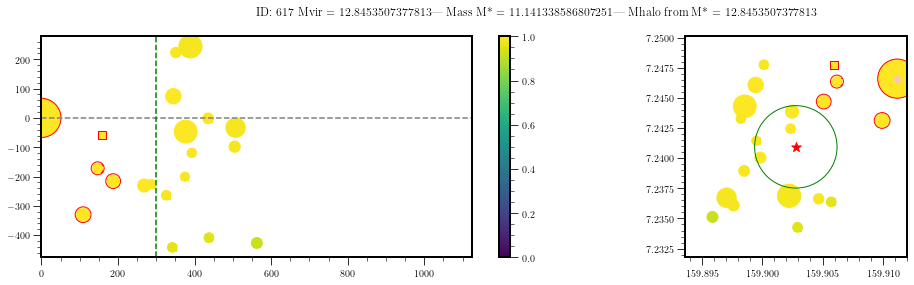

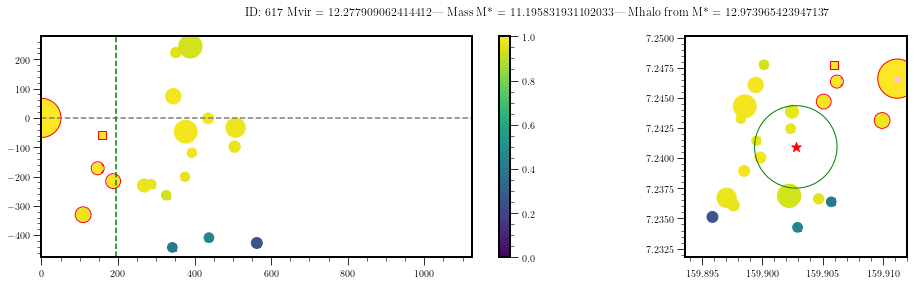

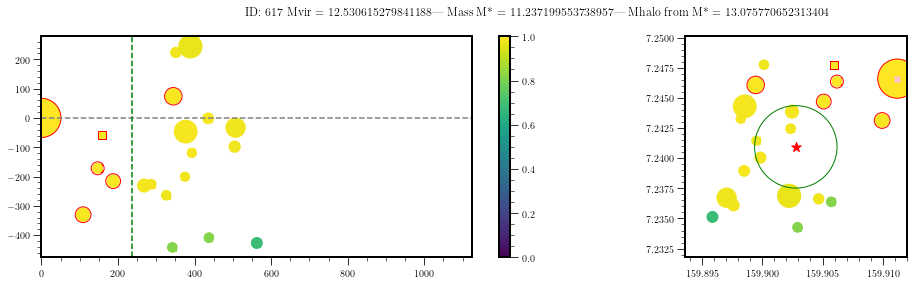

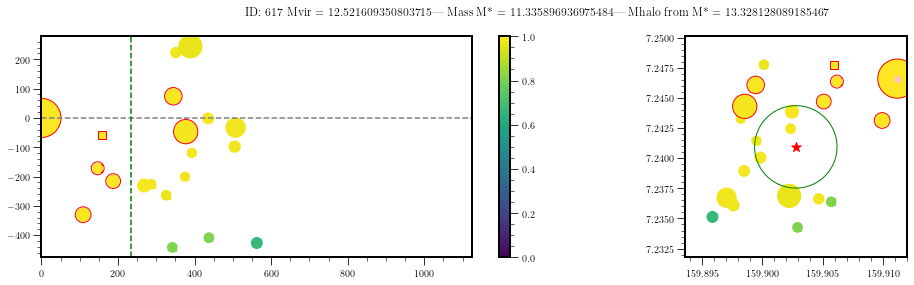

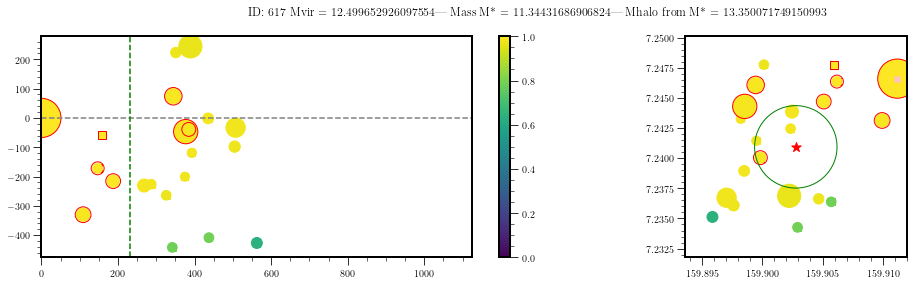

...

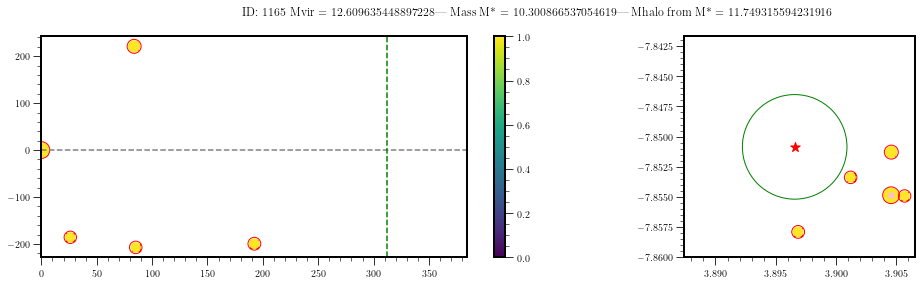

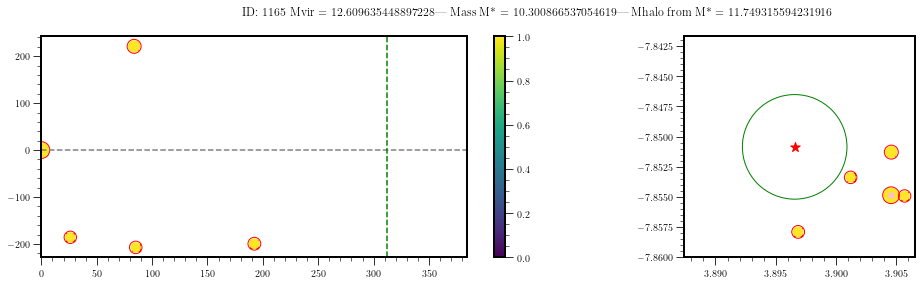

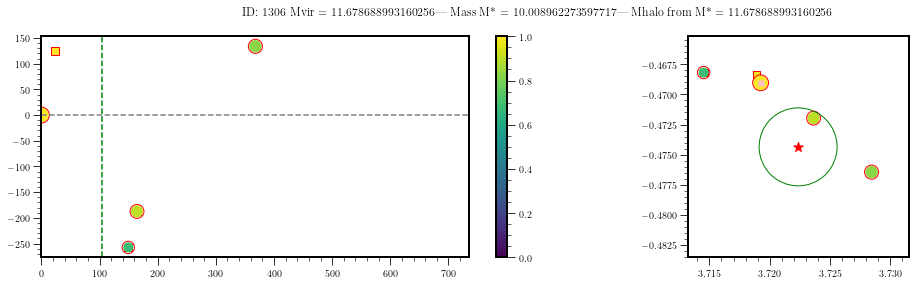

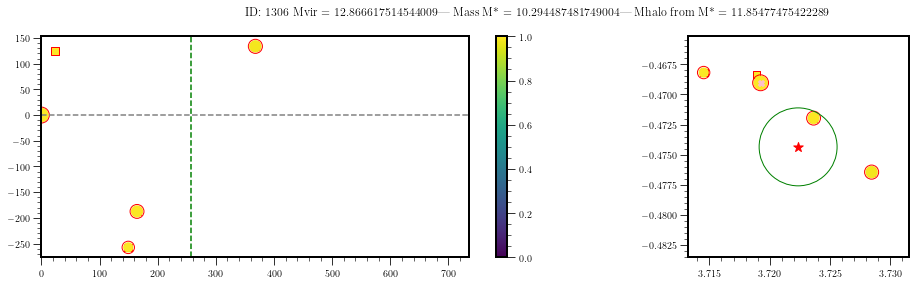

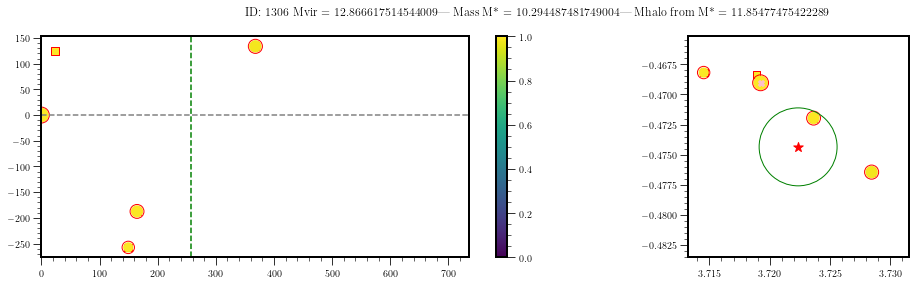

In [45]:
G_hom, R_hom = gid.hod_refinement_2(G_hom, R_hom)

In [46]:
R_hom.to_csv("R_hom_raw_referee_modif.csv", index = False)
G_hom.to_csv("G_hom_raw_referee_modif.csv", index = False)
#R_hom = pd.read_csv("R_hom_raw_v17.csv", index_col = False)
#G_hom = pd.read_csv("G_hom_raw_v17.csv", index_col = False)

In [47]:
print(len(R_hom))
print(len(G_hom))

2020
1392


In [48]:
G_hom = G_hom.sort_values(by="N_gal", ascending = False)
G_hom.head()

,field_id,group_id,N_gal,mean_z,mean_ra,mean_dec,b_min_kpc,Mvir_sigma2,Mvir_sigma3,Rvir_sigma2,...,Comments_qso,zqso_sdss,depth_qso,ebv_sfd_qso,ebv_sandf_qso,ebv_planck_qso,HST_qso,rmag_qso,ra_qso,dec_qso
1357,J1039p0714,617,21,0.987775,159.902,7.24136,46.37,7.630926e+12,4.314044e+12,309.353476,...,NaN,1.532,24.5,0.0402,0.0346,0.049340,None,NaN,159.902785,7.240934
1358,J0145p1056,861,21,0.937542,26.3047,10.9382,1.28,1.542607e+13,2.944945e+13,400.005144,...,NaN,0.938,24.5,0.0677,0.0582,0.064520,None,NaN,26.304623,10.940742
1359,J0014m0028,1300,15,0.830293,3.72,-0.477257,7.77,7.592986e+13,1.590934e+14,714.677895,...,NaN,1.927,25.0,0.0529,0.0455,0.061763,None,NaN,3.722351,-0.474349
1360,J1107p1021,555,14,0.744204,166.928,10.3572,36.59,1.271548e+13,1.686994e+13,410.318396,...,NaN,1.925,24.5,0.0262,0.0225,0.031879,WFC3,17.6,166.928091,10.357311
1361,J0058p0111,1089,11,0.637824,14.7337,1.19041,6.06,1.369764e+13,1.447567e+13,443.107144,...,NaN,1.222,24.5,0.0253,0.0218,0.029647,None,NaN,14.732323,1.191270


Now we would like to reobtain the group catalog. The problem is that the "outlier" column is from the caustic method. And to obtain the group we need that outliers = the galaxies with a low Psat. Let's do that:

In [49]:
R_hom["outlier"] = R_hom["Psat"].apply(lambda x : not bool(np.round(x)))

In [50]:
R_hom[["Psat", "outlier"]]

,Psat,outlier
0,NaN,False
1,NaN,False
2,NaN,False
3,NaN,False
4,NaN,False
...,...,...
2015,1.000000,False
2016,0.999608,False
2017,0.995121,False
2018,0.983647,False


In [51]:
G_final = gid.get_groups(R_hom, N_min = 1)
G3_final = gid.get_groups(R_hom, N_min = 3)
G5_final = gid.get_groups(R_hom, N_min = 5)
len(G_final)

1392

In [52]:
G_final = gid.calc_mass_ratio(G_final, R_hom)
G_final = gid.recompute_centers_new(G_final, R_hom)

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:225: RuntimeWarning: invalid value encountered in double_scalars
  center_ra = (r["mass10"] * r["RA"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:226: RuntimeWarning: invalid value encountered in double_scalars
  center_dec = (r["mass10"] * r["DEC"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:227: RuntimeWarning: invalid value encountered in double_scalars
  center_z = (r["mass10"] * r["Z"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:225: RuntimeWarning: invalid value encountered in double_scalars
  center_ra = (r["mass10"] * r["RA"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:226: RuntimeWarning: invalid value encountered in double_scalars
  center_dec = (r["mass10"] * r["DEC"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_group

In [53]:
R_final, G_final = gid.calc_mass(R_hom, G_final, N_lim = 3)

/home/mcherrey/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0, 0.5, 'M from $\\sigma^3$ (Bryan+97)')

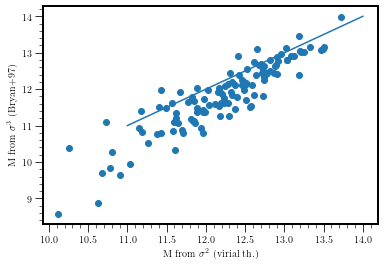

In [54]:
plt.scatter(np.log10(G_final["Mvir_sigma2"]), np.log10(G_final["Mvir_sigma3"]))
plt.plot([11,14],[11,14])
plt.xlabel("M from $\sigma^2$ (virial th.)")
plt.ylabel("M from $\sigma^3$ (Bryan+97)")

In [55]:
print("N of group of more than 3 galaxies: ", len(G3_final))
print("N of group of more than 5 galaxies: ", len(G5_final))

N of group of more than 3 galaxies:  123
N of group of more than 5 galaxies:  32


In [56]:
R_final = gid.match_qso(R_final, fields_info)

In [57]:
G_final = gid.create_id(G_final, "N_gal")

In [58]:
f1 = G_final["Mvir_sigma2"]>=1e12
f2 = G_final["Mvir_sigma2"]>=1e13
f3 = G_final["center_z"]>=0.3
f4 = G_final["center_z"]<=1.5
print("Number of groups with mass above 1e12 Msun: ", len(G_final[f1 & f3 & f4]))
print("Number of groups with mass above 1e13 Msun: ", len(G_final[f2 & f3 & f4]))

Number of groups with mass above 1e12 Msun:  63
Number of groups with mass above 1e13 Msun:  11


In [60]:
G_final.columns

Index(['index', 'field_id', 'group_id', 'N_gal', 'mean_z', 'mean_ra',
       'mean_dec', 'b_min_kpc', 'Mvir_sigma2', 'Mvir_sigma3', 'Rvir_sigma2',
       'Rvir_sigma3', 'Mstar', 'm1_m2_ratio', 'center_ra', 'center_dec',
       'center_z', 'center_ra_err', 'center_dec_err', 'center_z_err',
       'Mvir_sigma2_error', 'Rvir_sigma2_error', 'Mvir_sigma3_error',
       'Rvir_sigma3_error', 'Rmax', 'sigma_v', 'sigma_v_error', 'ID'],
      dtype='object')

In [61]:
G_final = gid.match_qso(G_final, fields_info)
len(G_final["group_id"])

1392

### N galaxies in xxx kpc

In [62]:
G_final = gid.get_Nxxx_all_groups(R_final, G_final, radius = 100)
G_final = gid.get_Nxxx_all_groups(R_final, G_final, radius = 200)

### Nb of galaxies around the LOS

In [63]:
N100 = []
dv = 1e6
for i, r in R_final.iterrows():
    f1 = np.abs(R_final["Z"] - r["Z"])*const.c.value/(1+r["Z"])<dv
    f2 = R_final["field_id"] == r["field_id"]
    f3 = R_final["B_KPC"]<100
    F = R_final[f1 & f2 & f3]
    N100.append(len(F))
R_final["N100_los"] = np.array(N100)

In [64]:
G_final = gid.get_N100_LOS(G_final, R_final, dv = 1e6)

### Nb of neighb for each galaxy

In [65]:
R_final = gid.get_Nxxx_neighb(R_final, radius = 100)
R_final = gid.get_Nxxx_neighb(R_final, radius = 50)

### Impact parameter relatively to the center of the groups

In [66]:
ra0 = G_final["center_ra"]*u.degree
ra1 = G_final["mean_ra"]*u.degree
ra2 = G_final["ra_qso"]*u.degree
dec0 = G_final["center_dec"]*u.degree
dec1 = G_final["mean_dec"]*u.degree
dec2 = G_final["dec_qso"]*u.degree
c0 = SkyCoord(ra0, dec0)
c1 = SkyCoord(ra1, dec1)
c2 = SkyCoord(ra2, dec2)
sep0 = c0.separation(c2)
sep1 = c1.separation(c2)
G_final["dist"] = Distance(unit=u.kpc, z = G_final["center_z"]).value/((1+G_final["center_z"])**2)
G_final["b_center_kpc"] = sep0.radian*G_final["dist"]
G_final["b_geomcenter_kpc"] = sep1.radian*G_final["dist"]
G_final = G_final.astype({"b_center_kpc":"float"})
G_final = G_final.astype({"b_geomcenter_kpc":"float"})

### Impact parameters normalized by Rvir:

In [67]:
G_final = gid.b_center_error(G_final)

In [68]:
G_final["b_min_kpc_norm2"] = G_final["b_min_kpc"]/G_final["Rvir_sigma2"] 
G_final["b_center_kpc_norm2"] = G_final["b_center_kpc"]/G_final["Rvir_sigma2"] 
G_final["b_geomcenter_kpc_norm2"] = G_final["b_geomcenter_kpc"]/G_final["Rvir_sigma2"]

G_final["b_min_kpc_norm2_err"] =  G_final["b_min_kpc_norm2"] * G_final["Rvir_sigma2_error"]/G_final["Rvir_sigma2"] 
G_final["b_center_kpc_norm2_err"] = G_final["b_center_err"]/G_final["Rvir_sigma2"] + G_final["b_center_kpc_norm2"] * G_final["Rvir_sigma2_error"]/G_final["Rvir_sigma2"] 
G_final["b_geomcenter_kpc_norm2_err"] = G_final["b_geomcenter_kpc_norm2"]* G_final["Rvir_sigma2_error"]/G_final["Rvir_sigma2"]

G_final["b_min_kpc_norm3"] = G_final["b_min_kpc"]/G_final["Rvir_sigma3"] 
G_final["b_center_kpc_norm3"] = G_final["b_center_kpc"]/G_final["Rvir_sigma3"] 
G_final["b_geomcenter_kpc_norm3"] = G_final["b_geomcenter_kpc"]/G_final["Rvir_sigma3"]

G_final["b_min_kpc_norm3_err"] = G_final["b_min_kpc_norm3"] * G_final["Rvir_sigma3_error"]/G_final["Rvir_sigma3"] 
G_final["b_center_kpc_norm3_err"] = G_final["b_center_err"]/G_final["Rvir_sigma2"] + G_final["b_center_kpc_norm3"] * G_final["Rvir_sigma3_error"]/G_final["Rvir_sigma3"] 
G_final["b_geomcenter_kpc_norm3_err"] = G_final["b_geomcenter_kpc_norm3"]* G_final["Rvir_sigma3_error"]/G_final["Rvir_sigma3"]


### check if QSO is behind the groups

In [69]:
G_final["QSO_is_behind"] = G_final["mean_z"] <= G_final["zqso_sdss"] - 3e6/const.c.value

In [70]:
len(G_final[G_final["QSO_is_behind"] == True])

726

### Detection limit

In [71]:
R_final["detection_limit"] = 0.1/(1+R_final["Z"])
G_final["detection_limit"] = 0.1/(1+G_final["center_z"])

### absorption & emission expected lamba

In [72]:
G_final["lambda_oii_a"] = oii_a*(1+G_final["mean_z"])
G_final["lambda_oii_b"] = oii_b*(1+G_final["mean_z"])
G_final["lambda_mgii_a"] = mgii_a*(1+G_final["mean_z"])
G_final["lambda_mgii_b"] = mgii_b*(1+G_final["mean_z"])


R_final["lambda_oii_a"] = oii_a*(1+R_final["Z"])
R_final["lambda_oii_b"] = oii_b*(1+R_final["Z"])
R_final["lambda_mgii_a"] = mgii_a*(1+R_final["Z"])
R_final["lambda_mgii_b"] = mgii_b*(1+R_final["Z"])

### Match with absorptions:

In [73]:
Abs = gid.get_N100_abs(Abs, R_final, dv = 0.5e6)
Abs2 = gid.get_Nxxx_abs(Abs, R_final, bmax = 2000, dv = 0.5e6)
Abs3 = gid.get_Nxxx_abs_test(Abs, R_final, bmax = 100, dv = 0.5e6)
Abs4 = gid.get_Nxxx_abs_test(Abs, R_final, bmax = 2000, dv = 0.5e6)

N100_mean:  1.1428571428571428


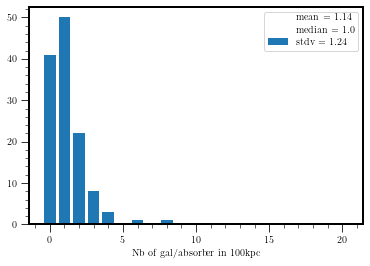

In [74]:
mean = np.mean(Abs["N100_abs"])
med = np.median(Abs["N100_abs"])
stdv = np.std(Abs["N100_abs"])
label = "mean = " + str(np.round(mean,2)) +\
        "\n median = "+ str(np.round(med,2)) +\
        "\n stdv = "+ str(np.round(stdv,2))
plt.hist(Abs["N100_abs"], range = (-0.5,20.5), bins = 21, rwidth = 0.8, label = label);
plt.xlabel("Nb of gal/absorber in 100kpc")
plt.legend()
print("N100_mean: ",np.mean(Abs["N100_abs"]))

In [46]:
mean = np.mean(Abs2["N2000_abs"])
med = np.median(Abs2["N2000_abs"])
stdv = np.std(Abs2["N2000_abs"])
label = "mean = " + str(np.round(mean,2)) +\
        "\n median = "+ str(np.round(med,2)) +\
        "\n stdv = "+ str(np.round(stdv,2))
plt.hist(Abs2["N2000_abs"], range = (-0.5,20.5), bins = 21, rwidth = 0.8, label = label);
plt.xlabel("Nb of gal/absorber")
plt.legend()

NameError: name 'Abs2' is not defined

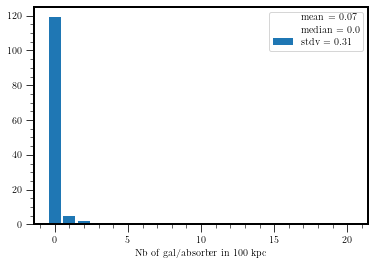

In [76]:
mean = np.mean(Abs["N100_abs_random"])
med = np.median(Abs["N100_abs_random"])
stdv = np.std(Abs["N100_abs_random"])
label = "mean = " + str(np.round(mean,2)) +\
        "\n median = "+ str(np.round(med,2)) +\
        "\n stdv = "+ str(np.round(stdv,2))
plt.hist(Abs3["N100_abs_random"], range = (-0.5,20.5), bins = 21, rwidth = 0.8, label = label);
plt.xlabel("Nb of gal/absorber in 100 kpc")
plt.legend()

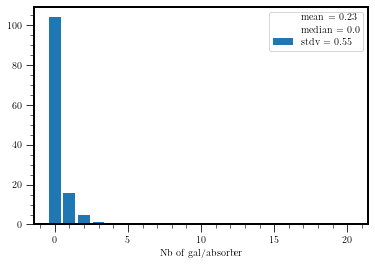

In [77]:
mean = np.mean(Abs["N2000_abs_random"])
med = np.median(Abs["N2000_abs_random"])
stdv = np.std(Abs["N2000_abs_random"])
label = "mean = " + str(np.round(mean,2)) +\
        "\n median = "+ str(np.round(med,2)) +\
        "\n stdv = "+ str(np.round(stdv,2))
plt.hist(Abs4["N2000_abs_random"], range = (-0.5,20.5), bins = 21, rwidth = 0.8, label = label);
plt.xlabel("Nb of gal/absorber")
plt.legend()

In [78]:
G_final = gid.match_absorptions(G_final, Abs, dv = 1e6)
R_final = gid.match_absorptions_isolated_galaxies(R_final, Abs, dv = 0.5e6)

### Filtering UVES coverage

In [79]:
cov_table = pd.read_csv("group_abs_coverage_table.csv")

In [80]:
dz = 0.5e6/const.c.value
grp_id = []
for i, c in cov_table.iterrows():
    f = c["field_id"]
    z = c["mean_z"]
    k1 = G_final["field_id"] == f
    k2 = G_final["mean_z"].between(z-dz, z+dz)
    match = G_final[k1 & k2]
    if len(match) == 1:
        grp_id.append(float(match["group_id"].values))
    else:
        grp_id.append(-1)
    #print(len(match))
cov_table["group_id"] = np.array(grp_id)

In [81]:
cov_table_trunc = cov_table[["group_id","FeII_2374_lim", "FeII_2600_lim", "MgII_2796_lim", "MgII_2803_lim", "MgI_2852_lim"]]

In [82]:
cov_table_trunc.drop_duplicates(subset ="group_id",keep = False, inplace = True)

In [83]:
G_final = G_final.merge(cov_table_trunc, on = "group_id", how = "left")

# Errors estimation

There are several sources of uncertainties to take into account.

The error bars for MgII EW are quite small.
The error bars for Mvir and Rvir are much more important.

Several things must be taken into account:
1. Rvir is computed from $\sigma^2$ or $\sigma^3$. The error on sigma comes from the sampling. The more we have galaxies, the better is the sampling. Assuming that velocities are normally distributed, the 1-σ uncertainty on $\sigma$ for a group of n galaxies is the standard error on the standard deviation on velocities and is equal to: $\sigma_{los} \sqrt{1 − c_4^2(n)}$ where $c_4(n) \approx 1-1/4n - 7/32n^2 - 19/128n^3$. For this component there is no bias.
2. Rvir is also computed from the visually estimated radius. This estimation is wrong because the FOV could crop the group. If we note L the half of the size of the FOV (here 30 arcsec), and if we consider a group of real radius R, there is an underestimation in $(2L)^2 - (2(L-R))^2$ cases upon a total of $(2L)^2$ cases. And the average underestimation is (if we except the case of the corners) $\approx \frac{R^2(2L-R)}{L^2}$. Of course it would be possible to refine this number for each group by considering the distance between its center and the LOS. For this source of error we have a bias toward lower values (it tends to underestimate Rvir)
3. The less galaxies we have in a group, the more we underestimate the radius of the group. This uncertainty can be estimated by a MC method (see in the dedicated notebook)
4. We consider the heaviest galaxy as the center of the group. What if it is not the case? Very difficult to estimate.... Could measure on TNG the distance between the central galaxy and DM halo center..

Maybe points 3 and 4 could be merged and resolved if we use the spatial dispersion to estimate the radius of the group.

In [84]:
print("N of group of more than 3 galaxies: ", len(G3_final))
print("N of group of more than 5 galaxies: ", len(G5_final))

N of group of more than 3 galaxies:  123
N of group of more than 5 galaxies:  32


In [85]:
G = G_final.copy()
R = R_final.copy()

f5 = G["N_gal"] == 1
f6 = G["N_gal"]  > 1
f7 = G["N100_los"] > 1
f8 = G["bool_absorption"] == 1
f9 = G["N_gal"] >= 5
f99 = G["N_gal"] >= 3
f10 = G["bool_absorption"] == 0
f11 = G["N_gal"] >= 2
f12 = G["MgII_2796_lim"] == np.inf
f13 = G["MgII_2796_lim"] != np.inf
f14 = G["QSO_is_behind"] == True
#f24 = G["ID"].isin(good_grp)

f15 = R["B_KPC"] <= 100
f16 = R["N100_los"] <= 2
f17 = R["N100_los"] <= 1
f18 = R["N50_neighb"] == 0
f19 = R["Z"] >= 4700/2796 - 1
f20 = R["Z"] <= 9300/2796 - 1
f21 = R["bool_absorption"] == 0
f22 = R["bool_absorption"] == 1
f23 = R["B_KPC"]>= 5 # remove the QSOs
#fweirds = G["Rvir_recomputed"] >= 10

In [86]:
G_abs = G[f8 & f14 & f13]
G_noabs = G[f10 & f14 & f13]
G2 = G[f7 & f13 & f14]
G2_abs = G[f8 & f7 & f14 & f13]
G2_noabs = G[f10 & f7 & f14 & f13]
G5 = G[f9 & f13 & f14]
#G5 = gid.create_id(G5, "N_gal")
G5_abs = G5[G5["bool_absorption"] == 1]
G5_noabs = G5[G5["bool_absorption"] == 0]
G3 = G[f99 & f13 & f14]
G3_abs = G3[G3["bool_absorption"] == 1]
G3_noabs = G3[G3["bool_absorption"] == 0]

R_ilane_abs = R[f22 & f15 & f17 & f18 & f23]
R_ilane_noabs = R[f21 & f15 & f17 & f18  & f23]
R_ilane2_abs = R[f22 & f17 & f18  & f23]
R_ilane2_noabs = R[f21 & f17 & f18  & f23]

In [87]:
print("nb of groups of more than 3 gal: ", len(G3))
print("nb of groups of more than 5 gal: ", len(G5))

nb of groups of more than 3 gal:  90
nb of groups of more than 5 gal:  26


# Some plots about our group sample

(10.0, 15.0)

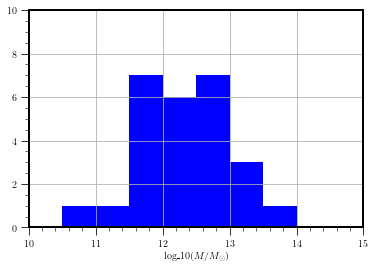

In [88]:
plt.hist(np.log10(G5["Mvir_sigma2"]), bins = 9, range = (10,14.5), color = 'blue');
plt.xlabel("log_{10}($M/M_{\odot}$)")
plt.grid()
plt.ylim((0,10))
plt.xlim((10,15))

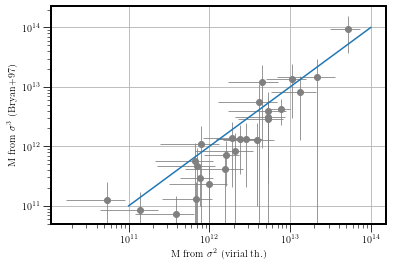

In [89]:
plt.errorbar(G5["Mvir_sigma2"], G5["Mvir_sigma3"], xerr = G5["Mvir_sigma2_error"], yerr = G5["Mvir_sigma3_error"],\
            fmt = 'o', c = "gray", linewidth = 0.8)
plt.plot([1e11,1e14],[1e11,1e14])
plt.xlabel("M from $\sigma^2$ (virial th.)")
plt.ylabel("M from $\sigma^3$ (Bryan+97)")
plt.xscale("log")
plt.yscale("log")
plt.grid()

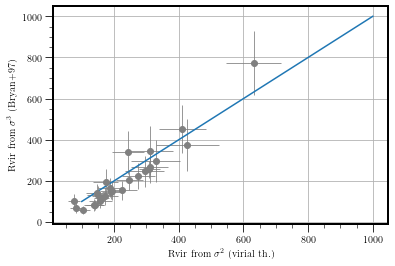

In [90]:
plt.errorbar(G5["Rvir_sigma2"], G5["Rvir_sigma3"], xerr = G5["Rvir_sigma2_error"], yerr = G5["Rvir_sigma3_error"],\
            fmt = 'o', c = "gray", linewidth = 0.8)
plt.plot([100,1000],[100,1000])
plt.xlabel("Rvir from $\sigma^2$ (virial th.)")
plt.ylabel("Rvir from $\sigma^3$ (Bryan+97)")
plt.grid()

In [91]:
G5_noabs["b_center_kpc_norm2_err"]

4     0.213089
9     0.302027
17    0.173621
18    0.151509
20    0.534374
Name: b_center_kpc_norm2_err, dtype: float64

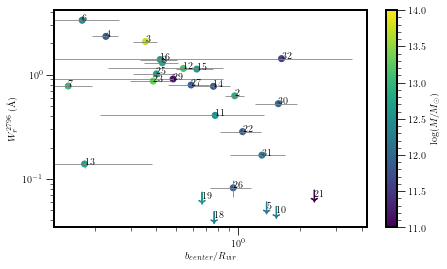

In [92]:
plt.figure(figsize = (7,4))
#plt.title("FoF groups ($N >= 5$)")
plt.errorbar(G5_abs["b_center_kpc_norm2"], G5_abs["REW_2796"], xerr = G5_abs["b_center_kpc_norm2_err"], yerr = G5_abs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G5_abs["b_center_kpc_norm2"], G5_abs["REW_2796"], marker = "o", label = "groups N >= 5", \
            c = np.log10(G5_abs["Mvir_sigma2"]), vmin = 11, vmax = 14)
plt.colorbar(label = "log($M/M_{\odot}$)")
plt.errorbar(G5_noabs["b_center_kpc_norm2"], G5_noabs["REW_2796"], xerr = G5_noabs["b_center_kpc_norm2_err"], yerr = G5_noabs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G5_noabs["b_center_kpc_norm2"], G5_noabs["detection_limit"], marker = "$\downarrow$", s = 150,\
            label = "groups N >= 5", c = np.log10(G5_noabs["Mvir_sigma2"]),vmin = 11, vmax = 14)

X = np.array(G5_abs["b_center_kpc_norm2"])
Y = np.array(G5_abs["REW_2796"])
txt = np.array(G5_abs["ID"])

for i in range(len(G5_abs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))
    
X = np.array(G5_noabs["b_center_kpc_norm2"])
Y = np.array(G5_noabs["detection_limit"])
txt = np.array(G5_noabs["ID"])

for i in range(len(G5_noabs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))


plt.xlabel("$b_{center}/R_{vir}$")
plt.ylabel("$W_r^{2796}$ (\AA)")
#plt.grid()
plt.xscale("log")
plt.yscale("log")
#plt.xlim((0.1,5))

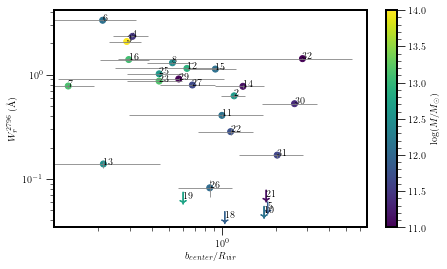

In [96]:
plt.figure(figsize = (7,4))
#plt.title("FoF groups ($N >= 5$)")
plt.errorbar(G5_abs["b_center_kpc_norm3"], G5_abs["REW_2796"], xerr = G5_abs["b_center_kpc_norm3_err"], yerr = G5_abs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G5_abs["b_center_kpc_norm3"], G5_abs["REW_2796"], marker = "o", label = "groups N >= 5", \
            c = np.log10(G5_abs["Mvir_sigma3"]), vmin = 11, vmax = 14)
plt.colorbar(label = "log($M/M_{\odot}$)")
plt.errorbar(G5_noabs["b_center_kpc_norm3"], G5_noabs["REW_2796"], xerr = G5_noabs["b_center_kpc_norm3_err"], yerr = G5_noabs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G5_noabs["b_center_kpc_norm3"], G5_noabs["detection_limit"], marker = "$\downarrow$", s = 150,\
            label = "groups N >= 5", c = np.log10(G5_noabs["Mvir_sigma3"]),vmin = 11, vmax = 14)

X = np.array(G5_abs["b_center_kpc_norm3"])
Y = np.array(G5_abs["REW_2796"])
txt = np.array(G5_abs["ID"])

for i in range(len(G5_abs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))
    
X = np.array(G5_noabs["b_center_kpc_norm3"])
Y = np.array(G5_noabs["detection_limit"])
txt = np.array(G5_noabs["ID"])

for i in range(len(G5_noabs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))


plt.xlabel("$b_{center}/R_{vir}$")
plt.ylabel("$W_r^{2796}$ (\AA)")
#plt.grid()
plt.xscale("log")
plt.yscale("log")
#plt.xlim((0.1,5))

In [97]:
# the ids of the groups are:
id_list = G5["group_id"].to_list()
R5 = R[R["group_id"].isin(id_list)]
len(R5)

193

In [98]:
len(R5[R5["outlier"] == False])

184

# Exports

In [99]:
R_final.to_csv("R_referee_modif.csv", index = False)
G_final.to_csv("G_referee_modif.csv", index = False)

In [ ]:
#G5["m1_m2_ratio"] >= 1.5

In [ ]:
def calc_mass_ratio(G, R):
    G["m1_m2_ratio"] = -1
    for i, g in G.iterrows():
        r = R[R["group_id"] == g["group_id"]]
        r = r.sort_values(by="mass10", ascending = False)
        r = r[r["mass"].isna() == False]
        #print(r["mass"])
        if len(r) >= 2:
            r0 = r[:1]
            r1 = r[1:2]
            r0 = r0.squeeze()
            r1 = r1.squeeze()
            ratio = (10**r0["mass"])/(10**r1["mass"])
            #print("----------------------- RATIO = ", ratio)
            plt.figure()
            plt.suptitle("RATIO = " +str(np.round(ratio,3)))
            plt.scatter([1,2], [r0["mass10"], r1["mass10"]])
            plt.vlines([1,2], [10**r0["mass_l68"], 10**r1["mass_l68"]],[10**r0["mass_u68"],10**r1["mass_u68"]],\
                       color ="gray", linewidth = 0.8)
            plt.xlim((0,3))
            #plt.ylim((1e9,5e11))
            plt.yscale("log")
    return

In [ ]:
calc_mass_ratio(G5, R)

In [ ]:
gid.plot_groups_2(R, G5)

In [ ]:
G5.columns

for i, g in G5.iterrows():
    ra_c = g["center_ra"]* u.degree
    dec_c = g["center_dec"]*u.degree
    ra_c_err = (g["center_ra"] + g["center_ra_err"])*u.degree
    dec_c_err = (g["center_dec"] + g["center_dec_err"])*u.degree
    
    ra_qso = g["ra_qso"]* u.degree
    dec_qso = g["dec_qso"]*u.degree
    c1 = SkyCoord(ra_c, dec_c)
    c2 = SkyCoord(ra_qso, dec_c)
    c3 = SkyCoord(ra_c, dec_qso)
    c4 = SkyCoord(ra_c_err, dec_c)
    c5 = SkyCoord(ra_c, dec_c_err)
    
    ra_sep = c1.separation(c2)
    dec_sep = c1.separation(c3)
    ra_err_sep = c1.separation(c4)
    dec_err_sep = c1.separation(c5)
    ra_dist = ra_sep.radian*Distance(unit=u.kpc, z=g["center_z"]).value / ((1 + g["center_z"]) ** 2)
    dec_dist = dec_sep.radian*Distance(unit=u.kpc, z=g["center_z"]).value / ((1 + g["center_z"]) ** 2)
    ra_err_dist = ra_err_sep.radian*Distance(unit=u.kpc, z=g["center_z"]).value / ((1 + g["center_z"]) ** 2)
    dec_err_dist = dec_err_sep.radian*Distance(unit=u.kpc, z=g["center_z"]).value / ((1 + g["center_z"]) ** 2)
    #df["r_to_gcenter"] = sep.radian * Distance(unit=u.kpc, z=z_center).value / ((1 + z_center) ** 2)
    #print("dist =", ra_dist, dec_dist)
    b_kpc = (ra_dist**2 + dec_dist**2)**0.5 
    
    #print(b_kpc, g["b_center_kpc"])
    #print("errors = ", ra_err_dist, dec_err_dist)
    b_ra_err = ra_dist*ra_err_dist/b_kpc
    b_dec_err = dec_dist*dec_err_dist/b_kpc
    
    b_err = b_ra_err + b_dec_err
    
    print("b error = ", b_err, " -----ra_contribution = ", b_ra_err, "---dec_contribution = ", b_dec_err)
    print("------------------------------------------ra_err = ", ra_err_dist, "------------dec_err = ", dec_err_dist)

#### 

In [ ]:
51.51 - 6.75 - 3.10 - 2.99 - 2.14 - 4.75 - 0.37

In [ ]:
10**2.12